In [71]:
# Importar las librerias

# Ejercicio 1
# Librerias
import pandas as pd
import random
import shap
import seaborn as sns
import numpy as np
from pyexpat import model
import optuna
import warnings
from sklearn.cluster import KMeans
import contextily as ctx
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, cross_val_score, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, make_scorer, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report, balanced_accuracy_score, ConfusionMatrixDisplay, roc_curve, auc
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer, KNNImputer
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from pycaret.classification import *
from sklearn.datasets import make_classification, load_breast_cancer
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import accuracy_score
from keras.models import Sequential
from keras.layers import Dense
from sklearn.metrics import classification_report
from skopt import gp_minimize
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score


In [72]:
# Cargar el dataset
df_original = pd.read_csv('weatherAUS.csv')
df_ciudades=df_original.copy()

print("Columnas dataset", "(Cantidad:" , len(df_ciudades.columns), "):", df_ciudades.columns)

Columnas dataset (Cantidad: 23 ): Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')


In [73]:
ciudades = df_ciudades['Location'].unique()
print(f"Número de ciudades únicas: {len(ciudades)}")
print(f"Ciudades: {ciudades}")

Número de ciudades únicas: 49
Ciudades: ['Albury' 'BadgerysCreek' 'Cobar' 'CoffsHarbour' 'Moree' 'Newcastle'
 'NorahHead' 'NorfolkIsland' 'Penrith' 'Richmond' 'Sydney' 'SydneyAirport'
 'WaggaWagga' 'Williamtown' 'Wollongong' 'Canberra' 'Tuggeranong'
 'MountGinini' 'Ballarat' 'Bendigo' 'Sale' 'MelbourneAirport' 'Melbourne'
 'Mildura' 'Nhil' 'Portland' 'Watsonia' 'Dartmoor' 'Brisbane' 'Cairns'
 'GoldCoast' 'Townsville' 'Adelaide' 'MountGambier' 'Nuriootpa' 'Woomera'
 'Albany' 'Witchcliffe' 'PearceRAAF' 'PerthAirport' 'Perth' 'SalmonGums'
 'Walpole' 'Hobart' 'Launceston' 'AliceSprings' 'Darwin' 'Katherine'
 'Uluru']


In [74]:
# 3. Diccionario de coordenadas para ciudades australianas (latitud, longitud)
coordenadas = {
    'Albury': (-36.0737, 146.9135),
    'BadgerysCreek': (-33.8680, 150.7650),
    'Cobar': (-31.4950, 145.8390),
    'CoffsHarbour': (-30.2963, 153.1179),
    'Moree': (-29.4650, 149.8344),
    'Newcastle': (-32.9283, 151.7817),
    'NorahHead': (-33.2809, 151.5773),
    'NorfolkIsland': (-29.0408, 167.9547),
    'Penrith': (-33.7511, 150.6942),
    'Richmond': (-33.5983, 150.7511),
    'Sydney': (-33.8688, 151.2093),
    'SydneyAirport': (-33.9399, 151.1753),
    'WaggaWagga': (-35.1082, 147.3598),
    'Williamtown': (-32.8136, 151.8367),
    'Wollongong': (-34.4278, 150.8931),
    'Canberra': (-35.2809, 149.1300),
    'Tuggeranong': (-35.4244, 149.0888),
    'MountGinini': (-35.5329, 148.7822),
    'Ballarat': (-37.5622, 143.8503),
    'Bendigo': (-36.7570, 144.2794),
    'Sale': (-38.1026, 147.0678),
    'MelbourneAirport': (-37.6690, 144.8410),
    'Melbourne': (-37.8136, 144.9631),
    'Mildura': (-34.2080, 142.1246),
    'Nhil': (-36.3331, 141.6503),
    'Portland': (-38.3432, 141.6036),
    'Watsonia': (-37.7071, 145.0830),
    'Dartmoor': (-37.9144, 141.2692),
    'Brisbane': (-27.4698, 153.0251),
    'Cairns': (-16.9186, 145.7781),
    'GoldCoast': (-28.0167, 153.4000),
    'Townsville': (-19.2590, 146.8169),
    'Adelaide': (-34.9285, 138.6007),
    'MountGambier': (-37.8316, 140.7830),
    'Nuriootpa': (-34.4703, 138.9976),
    'Woomera': (-31.1950, 136.8050),
    'Albany': (-35.0274, 117.8839),
    'Witchcliffe': (-34.0278, 115.1044),
    'PearceRAAF': (-31.6677, 115.9984),
    'PerthAirport': (-31.9385, 115.9673),
    'Perth': (-31.9505, 115.8605),
    'SalmonGums': (-32.9827, 121.6293),
    'Walpole': (-34.9535, 116.7075),
    'Hobart': (-42.8821, 147.3272),
    'Launceston': (-41.4332, 147.1455),
    'AliceSprings': (-23.6980, 133.8807),
    'Darwin': (-12.4634, 130.8456),
    'Katherine': (-14.4647, 132.2660),
    'Uluru': (-25.3444, 131.0369)
}
coords_df = pd.DataFrame(
    [(ciudad, lat, lon) for ciudad, (lat, lon) in coordenadas.items()],
    columns=['Ciudad', 'Latitud', 'Longitud']
)

In [75]:
def metodo_codo(data, max_k=10):
    inertias = []
    for k in range(1, max_k+1):
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(data)
        inertias.append(kmeans.inertia_)

    plt.figure(figsize=(10, 6))
    plt.plot(range(1, max_k+1), inertias, 'bo-')
    plt.xlabel('Número de clusters (k)')
    plt.ylabel('Inercia')
    plt.title('Método del codo para determinar k óptimo')
    plt.grid(True)
    plt.show()
    return inertias

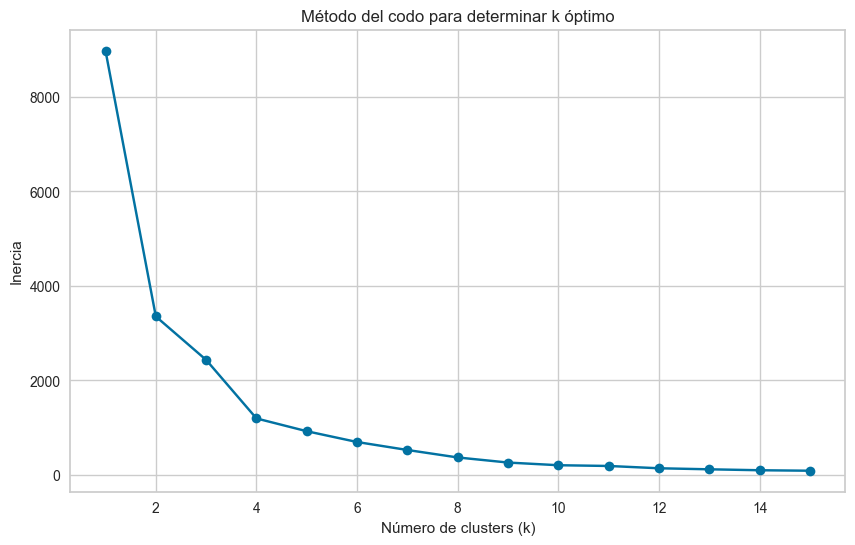

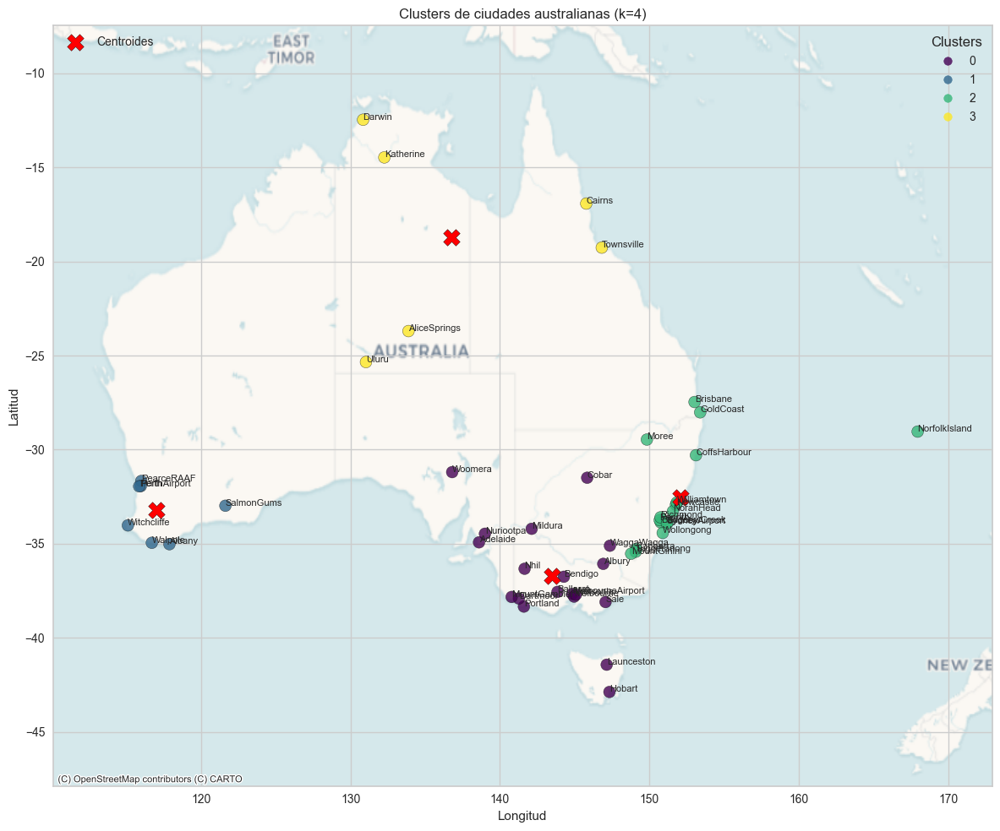


Ciudades en cada cluster:
Cluster 0: Albury, Cobar, WaggaWagga, Ballarat, Bendigo, Sale, MelbourneAirport, Melbourne, Mildura, Nhil, Portland, Watsonia, Dartmoor, Adelaide, MountGambier, Nuriootpa, Woomera, Hobart, Launceston
Cluster 1: Albany, Witchcliffe, PearceRAAF, PerthAirport, Perth, SalmonGums, Walpole
Cluster 2: BadgerysCreek, CoffsHarbour, Moree, Newcastle, NorahHead, NorfolkIsland, Penrith, Richmond, Sydney, SydneyAirport, Williamtown, Wollongong, Canberra, Tuggeranong, MountGinini, Brisbane, GoldCoast
Cluster 3: Cairns, Townsville, AliceSprings, Darwin, Katherine, Uluru
              Ciudad  Cluster              Nombre_Región
0             Albury        0         Queensland Central
44        Launceston        0         Queensland Central
43            Hobart        0         Queensland Central
35           Woomera        0         Queensland Central
34         Nuriootpa        0         Queensland Central
33      MountGambier        0         Queensland Central
32          

In [76]:
X = coords_df[['Latitud', 'Longitud']].values

metodo_codo(X, max_k=15)

n_clusters = 4

kmeans = KMeans(n_clusters=n_clusters, random_state=42)
coords_df['Cluster'] = kmeans.fit_predict(X)

plt.figure(figsize=(12, 10))
ax = plt.gca()

scatter = ax.scatter(
    coords_df['Longitud'],
    coords_df['Latitud'],
    c=coords_df['Cluster'],
    cmap='viridis',
    s=100,
    alpha=0.8,
    edgecolor='k'
)

for i, row in coords_df.iterrows():
    ax.text(row['Longitud'], row['Latitud'], row['Ciudad'], fontsize=8)

centroides = kmeans.cluster_centers_
ax.scatter(
    centroides[:, 1],
    centroides[:, 0],
    marker='X',
    s=200,
    c='red',
    edgecolor='k',
    label='Centroides'
)

ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.CartoDB.Voyager)

min_lon = coords_df['Longitud'].min() - 5
max_lon = coords_df['Longitud'].max() + 5
min_lat = coords_df['Latitud'].min() - 5
max_lat = coords_df['Latitud'].max() + 5

ax.set_xlim(min_lon, max_lon)
ax.set_ylim(min_lat, max_lat)

legend1 = plt.legend(*scatter.legend_elements(),
                     loc="upper right", title="Clusters")
ax.add_artist(legend1)

ax.legend(loc="upper left")

plt.title(f'Clusters de ciudades australianas (k={n_clusters})')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.tight_layout()
plt.show()

nombres_regiones = {
    0: 'Queensland Central',         # Brisbane, Gold Coast
    1: 'Australia Occidental',       # Perth, PearceRAAF, PerthAirport
    2: 'Territorio Norte',          # Darwin, Katherine
    3: 'Nueva Gales del Sur Norte', # Newcastle, Sydney, SydneyAirport y costa
    4: 'Victoria',                  # Melbourne, MelbourneAirport, Ballarat, Bendigo
    5: 'Queensland Norte',          # Cairns, Townsville
    6: 'Australia Occidental Sur',  # Albany, Walpole, SalmonGums
    7: 'Australia Central',         # AliceSprings, Uluru
    8: 'Tasmania',                  # Hobart, Launceston
    9: 'Australia del Sur',         # Adelaide, MountGambier, Nuriootpa, Woomera
}


# Ver las asignaciones de ciudades a clusters
print("\nCiudades en cada cluster:")
for i in range(n_clusters):
    ciudades_cluster = coords_df[coords_df['Cluster'] == i]['Ciudad'].tolist()
    print(f"Cluster {i}: {', '.join(ciudades_cluster)}")

# Ajustar los nombres si es necesario después de ver los resultados

coords_df['Nombre_Región'] = coords_df['Cluster'].map(nombres_regiones)

print(coords_df[['Ciudad', 'Cluster', 'Nombre_Región']].sort_values('Cluster'))

mapeo_ciudad_region = dict(zip(coords_df['Ciudad'], coords_df['Nombre_Región']))

df_ciudades['Region'] = df_ciudades['Location'].map(mapeo_ciudad_region)

In [77]:
df_ciudades

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Region
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,Queensland Central
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,Queensland Central
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,Queensland Central
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,Queensland Central
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,Queensland Central
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No,Nueva Gales del Sur Norte
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No,Nueva Gales del Sur Norte
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No,Nueva Gales del Sur Norte
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No,Nueva Gales del Sur Norte


Podemos ver que por el grafico del codo el mejor valor de K es 4.

Número de clusters encontrados: 6
Número de puntos de ruido: 4


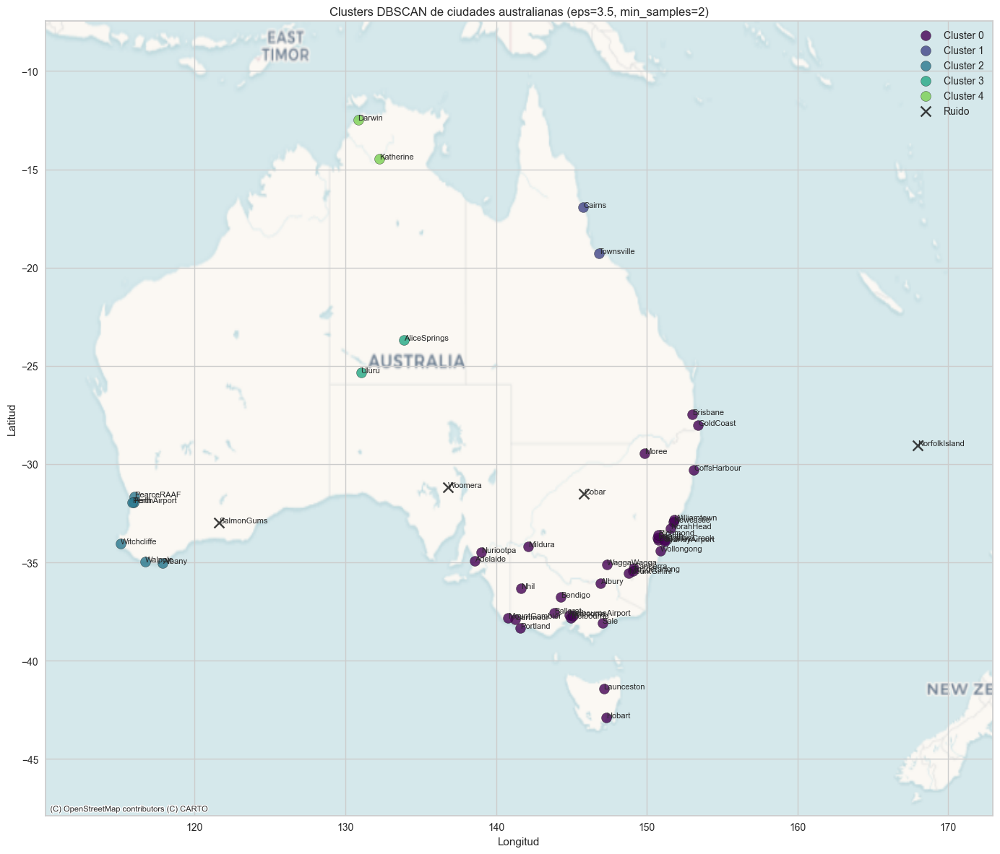


Ciudades en cada cluster:
Ruido (sin cluster): Cobar, NorfolkIsland, Woomera, SalmonGums
Cluster 0: Albury, BadgerysCreek, CoffsHarbour, Moree, Newcastle, NorahHead, Penrith, Richmond, Sydney, SydneyAirport, WaggaWagga, Williamtown, Wollongong, Canberra, Tuggeranong, MountGinini, Ballarat, Bendigo, Sale, MelbourneAirport, Melbourne, Mildura, Nhil, Portland, Watsonia, Dartmoor, Brisbane, GoldCoast, Adelaide, MountGambier, Nuriootpa, Hobart, Launceston
Cluster 1: Cairns, Townsville
Cluster 2: Albany, Witchcliffe, PearceRAAF, PerthAirport, Perth, Walpole
Cluster 3: AliceSprings, Uluru
Cluster 4: Darwin, Katherine


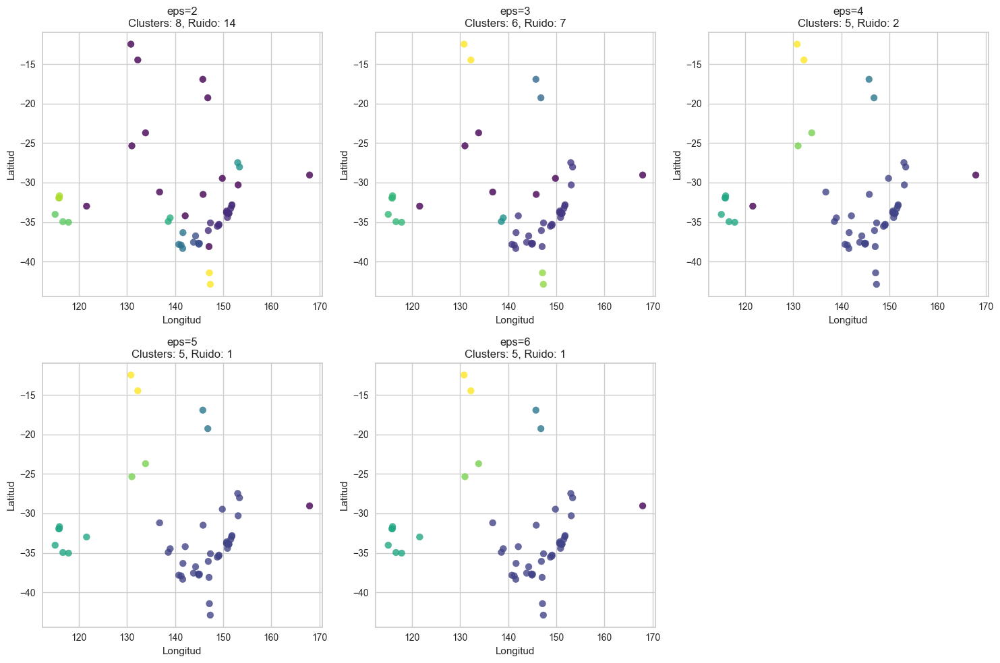


Comparación K-means vs DBSCAN:
              Ciudad  Cluster  Cluster_DBSCAN              Nombre_Región  \
2              Cobar        0              -1         Queensland Central   
41        SalmonGums        1              -1       Australia Occidental   
35           Woomera        0              -1         Queensland Central   
7      NorfolkIsland        2              -1           Territorio Norte   
0             Albury        0               0         Queensland Central   
22         Melbourne        0               0         Queensland Central   
23           Mildura        0               0         Queensland Central   
25          Portland        0               0         Queensland Central   
26          Watsonia        0               0         Queensland Central   
27          Dartmoor        0               0         Queensland Central   
28          Brisbane        2               0           Territorio Norte   
32          Adelaide        0               0         Qu

In [78]:
# Usando las coordenadas que ya tienes
X = coords_df[['Latitud', 'Longitud']].values

# Parámetros para DBSCAN
# eps: radio de búsqueda (ajusta según la dispersión geográfica)
# min_samples: mínimo de puntos para formar un cluster
eps = 3.5  # Puedes ajustar este valor
min_samples = 2

# Aplicar DBSCAN
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
coords_df['Cluster_DBSCAN'] = dbscan.fit_predict(X)

# Contar clusters (excluyendo ruido que es -1)
n_clusters_dbscan = len(set(coords_df['Cluster_DBSCAN'])) - (1 if -1 in coords_df['Cluster_DBSCAN'] else 0)
n_noise = list(coords_df['Cluster_DBSCAN']).count(-1)

print(f'Número de clusters encontrados: {n_clusters_dbscan}')
print(f'Número de puntos de ruido: {n_noise}')

# Visualización
plt.figure(figsize=(14, 12))
ax = plt.gca()

# Colorear según cluster (ruido en negro)
unique_labels = set(coords_df['Cluster_DBSCAN'])
colors = plt.cm.viridis(np.linspace(0, 1, len(unique_labels)))

for k, col in zip(unique_labels, colors):
    if k == -1:
        # Ruido en negro
        col = 'k'
        marker = 'x'
    else:
        marker = 'o'

    class_member_mask = (coords_df['Cluster_DBSCAN'] == k)
    xy = coords_df[class_member_mask][['Longitud', 'Latitud']]

    ax.scatter(xy['Longitud'], xy['Latitud'], c=[col], marker=marker,
              s=100, alpha=0.8, edgecolor='k', label=f'Cluster {k}' if k != -1 else 'Ruido')

# Etiquetas de ciudades
for i, row in coords_df.iterrows():
    ax.text(row['Longitud'], row['Latitud'], row['Ciudad'], fontsize=8)

# Mapa base
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.CartoDB.Voyager)

# Límites
min_lon = coords_df['Longitud'].min() - 5
max_lon = coords_df['Longitud'].max() + 5
min_lat = coords_df['Latitud'].min() - 5
max_lat = coords_df['Latitud'].max() + 5
ax.set_xlim(min_lon, max_lon)
ax.set_ylim(min_lat, max_lat)

plt.legend()
plt.title(f'Clusters DBSCAN de ciudades australianas (eps={eps}, min_samples={min_samples})')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.tight_layout()
plt.show()

# Ver las ciudades en cada cluster
print("\nCiudades en cada cluster:")
for cluster in sorted(coords_df['Cluster_DBSCAN'].unique()):
    ciudades_cluster = coords_df[coords_df['Cluster_DBSCAN'] == cluster]['Ciudad'].tolist()
    if cluster == -1:
        print(f"Ruido (sin cluster): {', '.join(ciudades_cluster)}")
    else:
        print(f"Cluster {cluster}: {', '.join(ciudades_cluster)}")

# Experimentar con diferentes valores de eps
eps_values = [2, 3, 4, 5, 6]
plt.figure(figsize=(15, 10))

for i, eps_val in enumerate(eps_values):
    dbscan_temp = DBSCAN(eps=eps_val, min_samples=2)
    labels = dbscan_temp.fit_predict(X)

    plt.subplot(2, 3, i+1)
    plt.scatter(coords_df['Longitud'], coords_df['Latitud'],
               c=labels, cmap='viridis', s=50, alpha=0.8)

    n_clusters_temp = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise_temp = list(labels).count(-1)

    plt.title(f'eps={eps_val}\nClusters: {n_clusters_temp}, Ruido: {n_noise_temp}')
    plt.xlabel('Longitud')
    plt.ylabel('Latitud')

plt.tight_layout()
plt.show()

# Asignar nombres a las regiones basándose en los clusters encontrados
# (ajusta según los resultados que obtengas)
nombres_regiones_dbscan = {}
for i in range(n_clusters_dbscan):
    nombres_regiones_dbscan[i] = f'Región {i}'
nombres_regiones_dbscan[-1] = 'Sin Región'  # Para puntos de ruido

coords_df['Region_DBSCAN'] = coords_df['Cluster_DBSCAN'].map(nombres_regiones_dbscan)

'''# Crear el mapeo final para el dataframe original
mapeo_ciudad_region_dbscan = dict(zip(coords_df['Ciudad'], coords_df['Region_DBSCAN']))
df_ciudades['Region_DBSCAN'] = df_ciudades['Location'].map(mapeo_ciudad_region_dbscan)'''

# Comparar resultados
print("\nComparación K-means vs DBSCAN:")
comparacion = coords_df[['Ciudad', 'Cluster', 'Cluster_DBSCAN', 'Nombre_Región', 'Region_DBSCAN']]
print(comparacion.sort_values('Cluster_DBSCAN'))

# Ejercicio 2

Explicacion de cada Variable

Date: es la fecha en la que se registraron todos las variables climaticas.

Location: son las ciudades de Australia en dode se registraron las variables climaticas.

MinTemp: la temperatura minima del dia registrado en Date.

MaxTemp: la temperatura maxima del dia registrado en Date.

Rainfall: cantidad de milimetros de agua caida.

Evaporation: evaporacion del agua.

Sunshine: cantidad de horas de sol.

WindGustDir: direccion del viento mas fuerte.

WindGustSpeed: velocidad del viento mas fuerte.

WindDir9am: direccion del viento a las 9 am.

WindDir3pm: direccion del viento a las 3 pm.

WindSpeed9am: velocidad del viento a las 9 am.

WindSpeed3pm: velocidad del viento a las 3 pm.

Humidity9am: humedad a las 9 am.

Humidity3pm: humedad a las 3 pm.

Pressure9am: presion atmosferica a las 9 am.

Pressure3pm: presion atmosferica a las 3 pm.

Cloud9am: nubosidad a las 9 am.

Cloud3pm: nubosidad a las 3 pm.

Temp9am: temperatura a las 9 am.

Temp3pm: temperatura a las 3 pm.

RainToday: si hubo lluvia el dia de la fecha.

RainTomorrow: si va a llover mañana.



In [79]:
df_original = df_ciudades.copy()

Tenemos 145.460n registros con 23 columnas de datos.

La cantidad de datos que faltan en las columnas es:
Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
Region               0
dtype: int64


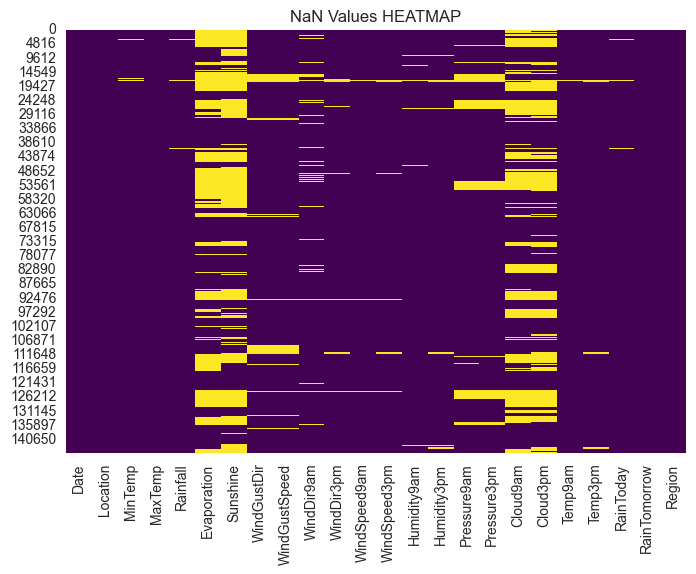

In [80]:
# Obtenemos con true o false las columnas null y luego las sumamos para saber que cantidad de valores faltantes tenemos por cada columna.
weather_null = df_original.isnull().sum()
print('La cantidad de datos que faltan en las columnas es:')
print(weather_null)

# Eliminamos las columnas de la clase donde tengan valos nan ya que estos registros no nos sirven para el entrenamiento del modelo.
# Ya que dicho valor a predecir no existe.
weather_depurado = df_original.dropna(subset=['RainTomorrow'])

# Mostramos la cantidad de datos faltantes con un Heatmap, donde cada linea amarilla indica que tiene un nan en ese indice de cregistro.
sns.heatmap(weather_depurado.isnull(), cbar=False, cmap='viridis')
plt.title('NaN Values HEATMAP')
plt.show()

# Conclusion: observamos que tenemos una cantidad alta de datos faltantes en la mayoria de las columnas.

Eliminamos 3267 registros que tenían valores nulos en la columna RainTomorrow   

Conclusion: observamos que tenemos una cantidad alta de datos faltantes en varias columnas, menos en la facha de registro del dato y la localidad donde se registro. Observamos que tenemos varias columnas que son categoricas, por lo tanto primero las transformamos a numericas y luego completamos los faltantes

In [81]:
# Contamos la cantidad de dias que llovio y los comparamos con lo que no llovio
si_no = weather_depurado['RainTomorrow'].value_counts()
print(f'La cantidad de dias que llovio vs los dias que no de la columna RainTomorrow es :{si_no}')

La cantidad de dias que llovio vs los dias que no de la columna RainTomorrow es :RainTomorrow
No     110316
Yes     31877
Name: count, dtype: int64


Conclucion: Podemos ver que el Dataset de weatherAUS.csv, una vez ya filtrados todos los valores nan de la columna 'RainTomorrow', vemos que tenemos un gran desvalance entre los dias que no llueven vs los dias que si llueven por lo que cuando entrenemos el modelo con estas cantidades vamos a ver afectado el modelo ya que va a tener muchos mas valores FN y FP ya que esta desbalanceado y va a tender a predecir mas dias que no llovia que dias que si.

Tenemos que realizar un sobmuestreo o un sobremuestreo, para balancar todo el dataset y no tener esa tendencia a que no llovio.

In [82]:
# Vemos una reduccion de las cantidades y vemos una reduccion del desbalance, auqnue todavia hay una gran brecha algunas varibles.
weather_depurado.info()

<class 'pandas.core.frame.DataFrame'>
Index: 142193 entries, 0 to 145458
Data columns (total 24 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           142193 non-null  object 
 1   Location       142193 non-null  object 
 2   MinTemp        141556 non-null  float64
 3   MaxTemp        141871 non-null  float64
 4   Rainfall       140787 non-null  float64
 5   Evaporation    81350 non-null   float64
 6   Sunshine       74377 non-null   float64
 7   WindGustDir    132863 non-null  object 
 8   WindGustSpeed  132923 non-null  float64
 9   WindDir9am     132180 non-null  object 
 10  WindDir3pm     138415 non-null  object 
 11  WindSpeed9am   140845 non-null  float64
 12  WindSpeed3pm   139563 non-null  float64
 13  Humidity9am    140419 non-null  float64
 14  Humidity3pm    138583 non-null  float64
 15  Pressure9am    128179 non-null  float64
 16  Pressure3pm    128212 non-null  float64
 17  Cloud9am       88536 non-null   fl

In [83]:
weather_depurado.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,141556.000000,141871.000000,140787.000000,81350.000000,74377.000000,132923.000000,140845.000000,139563.000000,140419.000000,138583.000000,128179.000000,128212.000000,88536.000000,85099.000000,141289.000000,139467.000000
mean,12.186400,23.226784,2.349974,5.469824,7.624853,39.984292,14.001988,18.637576,68.843810,51.482606,1017.653758,1015.258204,4.437189,4.503167,16.987509,21.687235
std,6.403283,7.117618,8.465173,4.188537,3.781525,13.588801,8.893337,8.803345,19.051293,20.797772,7.105476,7.036677,2.887016,2.720633,6.492838,6.937594
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,0.000000,0.000000,-7.200000,-5.400000
25%,7.600000,17.900000,0.000000,2.600000,4.900000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.900000,1010.400000,1.000000,2.000000,12.300000,16.600000
50%,12.000000,22.600000,0.000000,4.800000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.600000,1015.200000,5.000000,5.000000,16.700000,21.100000
75%,16.800000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.400000,1020.000000,7.000000,7.000000,21.600000,26.400000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.700000


In [84]:
# Creamos las variables dummy para las columna 'Region'.
# Para la cual hicimos 4 clusters para cada region de Australia con 1 si es a la region deonde esta la ciudad que pertencia y 0 si no lo es.
weather_depurado = pd.get_dummies(weather_depurado, columns=['Region'],drop_first=True)

weather_depurado['RainTomorrow'] = weather_depurado['RainTomorrow'].replace('Yes',1)
weather_depurado['RainTomorrow'] = weather_depurado['RainTomorrow'].replace('No',0)
weather_depurado['RainToday'] = weather_depurado['RainToday'].replace('Yes',1)
weather_depurado['RainToday'] = weather_depurado['RainToday'].replace('No',0)

In [85]:
# En las columnas 'WindGustDir', 'WindDir9am' y 'WindDir3pm' tenemos los puntos cardinales , donde son 16 en total.
# Estos 16 puntos cardinales los transformamos en sus repectivos grados, para luego aplicarle una transformacion
# llamada sen-cos la cual es muy util para varibles ciclicas como lo son estas. Creando por cada variable 2 columnas,
# una para seno y otra para coseno.
cardinal_to_angle = {
    'N': 0,
    'NNE': 22.5,
    'NE': 45,
    'ENE': 67.5,
    'E': 90,
    'ESE': 112.5,
    'SE': 135,
    'SSE': 157.5,
    'S': 180,
    'SSW': 202.5,
    'SW': 225,
    'WSW': 247.5,
    'W': 270,
    'WNW': 292.5,
    'NW': 315,
    'NNW': 337.5,
}

# Reemplazamops los puntos cardinales por sus respectivos angulos.
weather_depurado['WindGustDir'] = weather_depurado['WindGustDir'].replace(cardinal_to_angle)
weather_depurado['WindDir9am'] = weather_depurado['WindDir9am'].replace(cardinal_to_angle)
weather_depurado['WindDir3pm'] = weather_depurado['WindDir3pm'].replace(cardinal_to_angle)

# Calculamos las coordenadas seno y coseno para la variable 'WindGustDir'.
weather_depurado['WindGustDir_Sen'] = np.sin(weather_depurado['WindGustDir'])
weather_depurado['WindGustDir_Cos'] = np.cos(weather_depurado['WindGustDir'])


# Calculamos las coordenadas seno y coseno para la variable 'WindDir9am'.
weather_depurado['WindDir9am_Sen'] = np.sin(weather_depurado['WindDir9am'])
weather_depurado['WindDir9am_Cos'] = np.cos(weather_depurado['WindDir9am'])

# Calculamos las coordenadas seno y coseno para la variable 'WindDir3pm'.
weather_depurado['WindDir3pm_Sen'] = np.sin(weather_depurado['WindDir3pm'])
weather_depurado['WindDir3pm_Cos'] = np.cos(weather_depurado['WindDir3pm'])

#Eliminamos las varibles 'WindGustDir', 'WindDir9am' y 'WindDir3pm' ya que no van a ser necesarias para el entrenamiento de nuestro modelo.

weather_depurado = weather_depurado.drop(columns=['WindGustDir'])
weather_depurado = weather_depurado.drop(columns=['WindDir9am'])
weather_depurado = weather_depurado.drop(columns=['WindDir3pm'])

Realizamos los senos y cosenos de los estas columnas ya que realizan un siclo y es mejor para que cuando el algoritmo lo tenga asi para que no interprete mnal cuando obtenga los valores y tengamos unos mucho mas grande que otros y el algoritmo no puede resolver bien.

In [86]:
# Cambiamos el formato de la variable 'Date' a datetime de nuestro dataset para luego poder extraer el mes y el año.
weather_depurado['Date'] = pd.to_datetime(weather_depurado['Date'], format='%Y-%m-%d')

# Extraemos el mes y el año.
weather_depurado['Mes'] = weather_depurado['Date'].dt.month
weather_depurado['Año'] = weather_depurado['Date'].dt.year

# Eliminamos la variable 'Date', ya que no será útil para el entrenamiento de nuestro modelo.
weather_depurado = weather_depurado.drop(columns=['Date'],axis=1)

Conclusión: No utilizamos el día para entrenar el modelo, ya que no es significativa esa variable,porque nos podría provocar un sobreajuste cuando el modelo quiera predecir y no nos ayudaría en una generalización.

In [87]:
# Mostramos el total de columnas disponibles en el dataset para el entrenamiento del modelo.
weather_depurado.columns
# Eliminamos la columna region qaue es la umica que no nos sirve mas
weather_depurado = weather_depurado.drop(columns=['Location'])

In [88]:
# Separamos las columnas del dataset en dos conjuntos:
# por un lado, las características ('X'), y por otro, la clase a predecir ('y').
X = weather_depurado.drop('RainTomorrow', axis=1)
y = weather_depurado['RainTomorrow']

# Dividimos nuestro conjunto de datos en dos partes:
# un conjunto de entrenamiento y un conjunto de prueba.
# La división de los datos es 80/20, donde el 80% se utiliza para entrenamiento
# y el 20% restante para realizar pruebas.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Convertimos los conjuntos de entrenamiento y prueba a DataFrames para mantener la estructura del dataset original.
X_train = pd.DataFrame(X_train)
X_test = pd.DataFrame(X_test)

HISTOGRAM



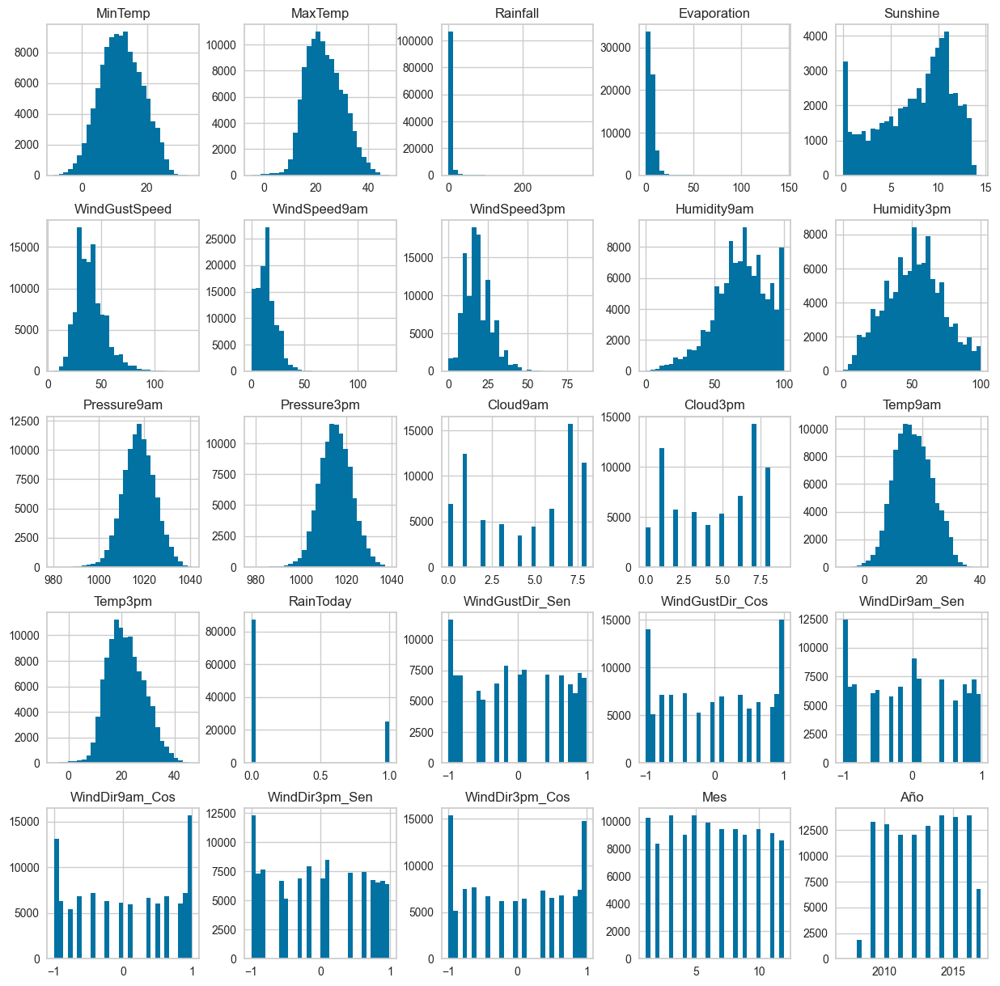

In [89]:
# Generamos un histograma para visualizar la distribución de cada columna del dataset,
# excluyendo la variable a predecir ('RainTomorrow').
print('HISTOGRAM')
print('')
# Creamos histogramas de todas las columnas de X_train en una figura con un diseño ajustado.
X_train.hist(bins=30, figsize=(15, 15))
# Mostramos la figura con todos los histogramas.
plt.show()

Conclusión: podemos observar que muchas de las variables se muestran de manera gaussiana como por ejemplo 'MinTemp'. Otras la vemos más sesgadas hacia uno de los laterales como por ejemplo 'Humidity9am' y las demás son variables categóricas transformadas que no presentan un patrón.

In [90]:
X_train.columns

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'RainToday', 'Region_Nueva Gales del Sur Norte',
       'Region_Queensland Central', 'Region_Territorio Norte',
       'WindGustDir_Sen', 'WindGustDir_Cos', 'WindDir9am_Sen',
       'WindDir9am_Cos', 'WindDir3pm_Sen', 'WindDir3pm_Cos', 'Mes', 'Año'],
      dtype='object')


PAIRPLOT



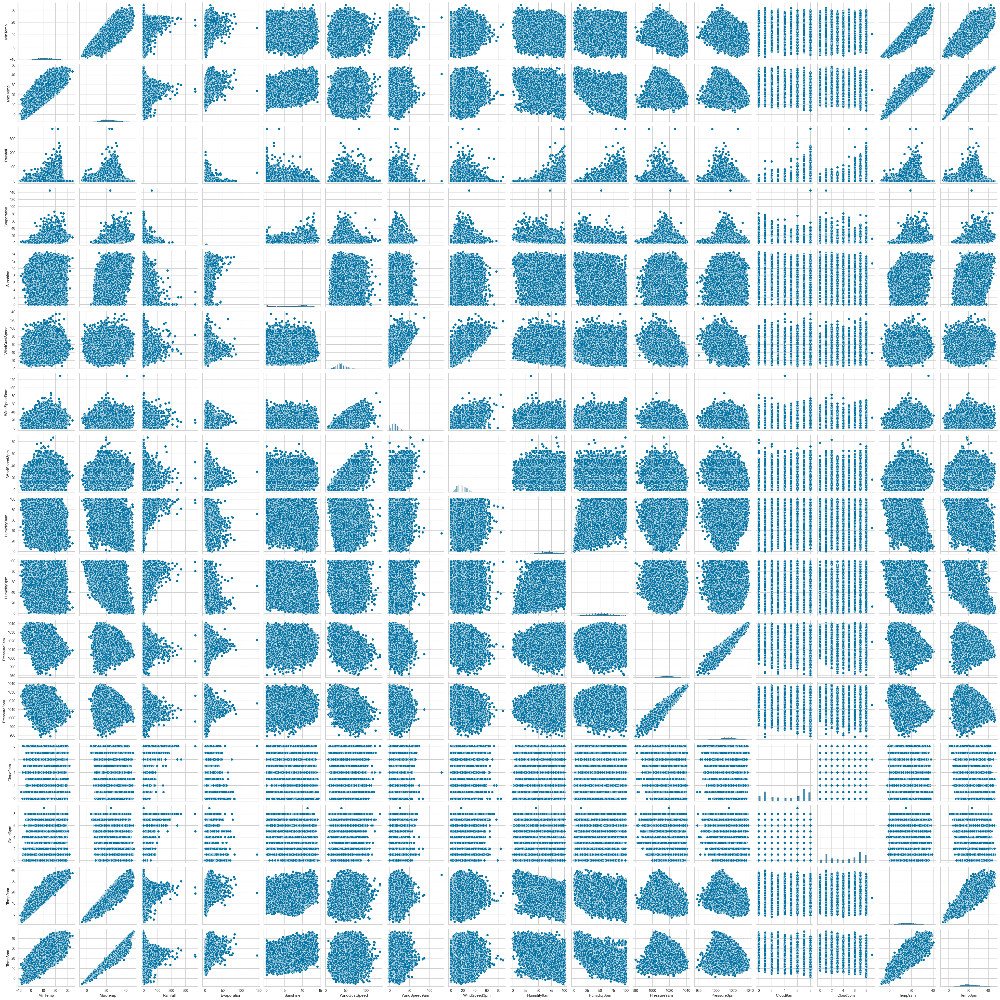

In [91]:
# Creamos un pairplot para comparar todas las columnas seleccionadas entre sí y observar cómo se relacionan,
# excluyendo la variable a predecir ('RainTomorrow').
print('')
print('PAIRPLOT')
print('')

# No utilizamos todas las variables, ya que las variables transformadas, como las dummies y las seno-coseno,
# no tienen una relación directa que permita obtener una noción completa de la variable original para comparar.
sns.pairplot(X_train[['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm']])
plt.show()

Conclusión:

Podemos observar que en la mayoría de los casos las relaciones entre las variables forman nubes de puntos dispersas, lo que indica que no tienen una relación clara. Sin embargo, hay algunas excepciones:

Las variables ‘Temp9am’, ‘Temp3pm’, ‘MinTemp’ y ‘MaxTemp’ muestran una relación lineal positiva: a medida que una aumenta, las otras también tienden a aumentar.
De manera similar, ‘Pressure9am’ y ‘Pressure3pm’ tienen una relación lineal positiva entre sí.
Además, observamos ciertas características interesantes en otras variables:

‘Rainfall’, ‘Evaporation’, ‘WindSpeed9am’ y ‘WindSpeed3pm’ tienden a concentrarse en valores pequeños. Esto significa que la mayoría de los datos están acumulados en valores bajos de estas variables, mientras que las variables con las que se comparan muestran una mayor variabilidad en todo su rango.



BOXPLOT



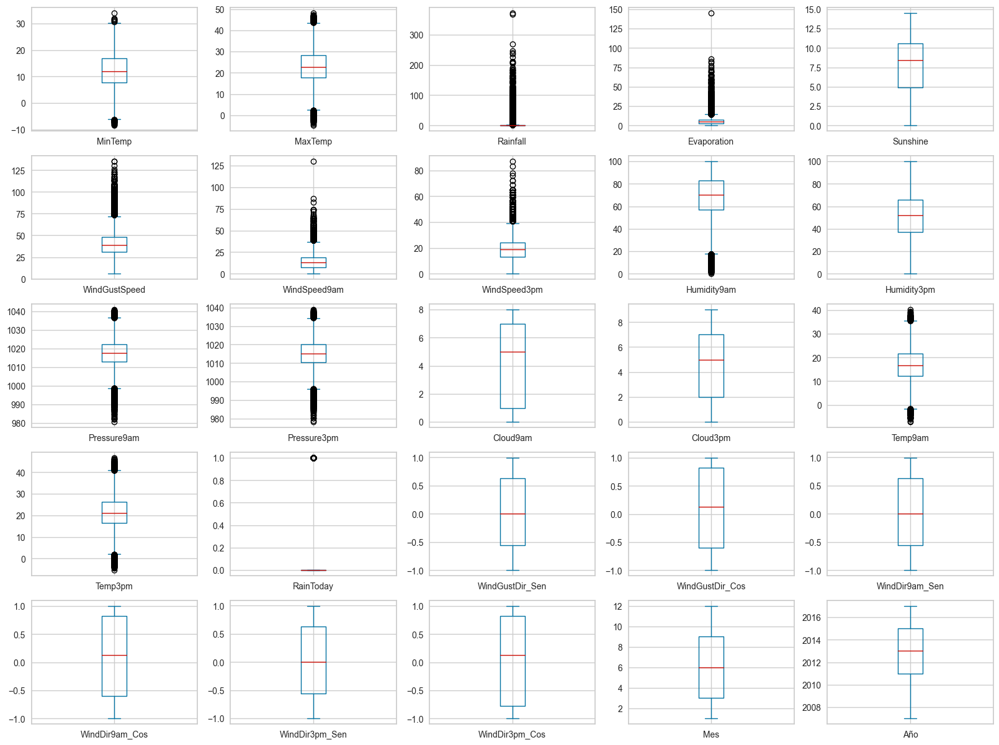

In [92]:
# Generamos un boxplot para visualizar la distribución y los valores atípicos de todas las variables,
# excepto la variable a predecir ('RainTomorrow').
print('')
print('BOXPLOT')
print('')
# Creamos un boxplot para cada variable en el dataset de entrenamiento.
X_train.plot(kind='box', subplots=True, layout=(5,5), figsize=(20, 15))
# Mostramos los boxplots.
plt.show()

Conclusión:

Hemos generado los boxplots para todas las variables. Observamos que en las variables ‘WindSpeed9am’, ‘Rainfall’, ‘WindSpeed3pm’ y ‘Evaporation’ es posible identificar valores atípicos. En los demás boxplots, aunque algunos puntos se encuentran fuera de los bigotes, no los consideramos valores atípicos debido a la cantidad considerable de datos que se visualizan en esas regiones, lo que sugiere que forman parte del conjunto principal de datos.

Decidimos no eliminar los valores atípicos, ya que consideramos que estos no se desvían de forma significativa de los rangos establecidos en los boxplots, excepto en el caso de ‘Rainfall’, donde identificamos aproximadamente 4 valores que podrían considerarse atípicos. Sin embargo, eliminar estos valores implicaría la eliminación de registros completos, y preferimos conservarlos, ya que podrían corresponder a casos reales importantes para el análisis.

In [93]:
def mixed_method(X_train, X_test, columns_mean, columns_median, columns_mode, columns_knn):
# Imputación de valores faltantes utilizando un "MÉTODO MIXTO".
    # Se realiza imputación estadística (SimpleImputer) para algunas columnas y KNNImputer para otras.

    # Creación de imputadores para diferentes estrategias.
  imputer_mean = SimpleImputer(strategy='mean')
  imputer_median = SimpleImputer(strategy='median')
  imputer_mode = SimpleImputer(strategy='most_frequent')
  imputer_knn = KNNImputer(n_neighbors=5)

    # Creación de un ColumnTransformer para aplicar diferentes estrategias de imputación por columna.
  preprocessor = ColumnTransformer(
      transformers=[
          ('mean', imputer_mean, columns_mean),
          ('median', imputer_median, columns_median),
          ('mode', imputer_mode, columns_mode),
          ('knn', imputer_knn, columns_knn)
      ],
      remainder='passthrough'
  )

    # Creación de un pipeline que incluye el preprocesador y el escalado de los datos.
  pipeline = Pipeline(steps=[
      ('preprocessor', preprocessor),
      ('scaler', StandardScaler())
  ])

    # Aplicación del pipeline a los datos de entrenamiento y prueba.
  X_train_scaled = pipeline.fit_transform(X_train)
  X_test_scaled = pipeline.transform(X_test)
    # Retornar los datos preprocesados y escalados.
  return X_train_scaled , X_test_scaled

In [94]:
weather_null = X_train.isnull().sum()
print('La cantidad de datos que faltan en las columnas es:')
print(weather_null)

La cantidad de datos que faltan en las columnas es:
MinTemp                               525
MaxTemp                               268
Rainfall                             1182
Evaporation                         48791
Sunshine                            54345
WindGustSpeed                        7406
WindSpeed9am                         1083
WindSpeed3pm                         2109
Humidity9am                          1420
Humidity3pm                          2913
Pressure9am                         11257
Pressure3pm                         11225
Cloud9am                            43041
Cloud3pm                            45767
Temp9am                               736
Temp3pm                              2206
RainToday                            1182
Region_Nueva Gales del Sur Norte        0
Region_Queensland Central               0
Region_Territorio Norte                 0
WindGustDir_Sen                      7458
WindGustDir_Cos                      7458
WindDir9am_Sen          

En todas las columnas tenemos valores faltantes menos en 'Mes', 'Año' y las columnas de las regiones.

In [95]:
X_train

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,Region_Queensland Central,Region_Territorio Norte,WindGustDir_Sen,WindGustDir_Cos,WindDir9am_Sen,WindDir9am_Cos,WindDir3pm_Sen,WindDir3pm_Cos,Mes,Año
18401,15.1,23.9,0.0,NaN,NaN,67.0,19.0,22.0,38.0,68.0,...,False,True,0.991205,0.132337,0.745133,0.666916,-0.176046,0.984382,10,2009
127797,9.7,14.2,7.6,NaN,NaN,50.0,15.0,28.0,91.0,56.0,...,False,False,0.633308,-0.773900,-0.325824,-0.945430,-0.176046,0.984382,9,2011
40012,13.2,25.4,0.0,3.2,8.8,30.0,6.0,17.0,79.0,63.0,...,False,True,-0.999021,-0.044228,-0.176046,0.984382,0.893997,-0.448074,4,2010
130914,7.6,14.8,0.0,4.0,7.0,94.0,30.0,35.0,52.0,45.0,...,True,False,-0.325824,-0.945430,-0.325824,-0.945430,-0.325824,-0.945430,7,2011
41742,12.9,22.2,0.0,4.0,7.9,37.0,15.0,20.0,69.0,52.0,...,False,True,-0.801153,-0.598460,-0.930095,0.367319,0.408096,0.912939,4,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112920,9.0,18.9,12.6,NaN,NaN,43.0,20.0,15.0,NaN,NaN,...,False,False,-0.176046,0.984382,-0.325824,-0.945430,-0.176046,0.984382,9,2012
122810,13.1,19.9,3.0,1.2,2.3,39.0,2.0,13.0,90.0,55.0,...,False,False,-0.930095,0.367319,-0.930095,0.367319,-0.176046,0.984382,9,2014
106280,10.8,25.5,0.0,12.0,13.0,44.0,26.0,15.0,41.0,21.0,...,True,False,0.991205,0.132337,0.991205,0.132337,0.408096,0.912939,12,2010
135107,11.3,21.4,0.0,NaN,NaN,39.0,19.0,22.0,75.0,79.0,...,True,False,-0.562441,0.826837,0.408096,0.912939,0.088369,-0.996088,11,2014


In [96]:
# Hemos seleccionado un método de imputación de valores faltantes específico para cada columna,
# basado en las distribuciones observadas en las gráficas:
# - Para distribuciones más gaussianas, aplicamos la **media**.
# - Para columnas con datos concentrados en un rango muy pequeño, aplicamos la **moda**.
# - Para columnas con sesgos hacia alguno de los extremos, aplicamos la **mediana**.
# - Para el resto de las columnas, utilizamos el método de imputación de **K vecinos**,
#   para que el valor a imputar tenga en cuenta los valores de los vecinos.

mean= ['MinTemp', 'MaxTemp', 'WindGustSpeed', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']

mode = [ 'Rainfall','Sunshine', 'WindSpeed9am']

median = ['Humidity9am','Humidity3pm', 'Evaporation', 'WindSpeed3pm']

knn = ['Cloud9am', 'Cloud3pm','RainToday', 'WindGustDir_Sen', 'WindGustDir_Cos',
       'WindDir9am_Sen', 'WindDir9am_Cos', 'WindDir3pm_Sen', 'WindDir3pm_Cos']



# Aplicamos el método mixto de imputación y escalado.
X_train_scaled , X_test_scaled = mixed_method(X_train,X_test,mean,median,mode,knn)
# Preparamos los datos escalados para realizar gráficos con SHAP.
X_train_scaled_shap = X_train_scaled
X_test_scaled_shap = X_test_scaled


# Convertimos los datos escalados en DataFrames con las mismas columnas originales,
# para realizar la regresión logística u otros análisis posteriores.
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

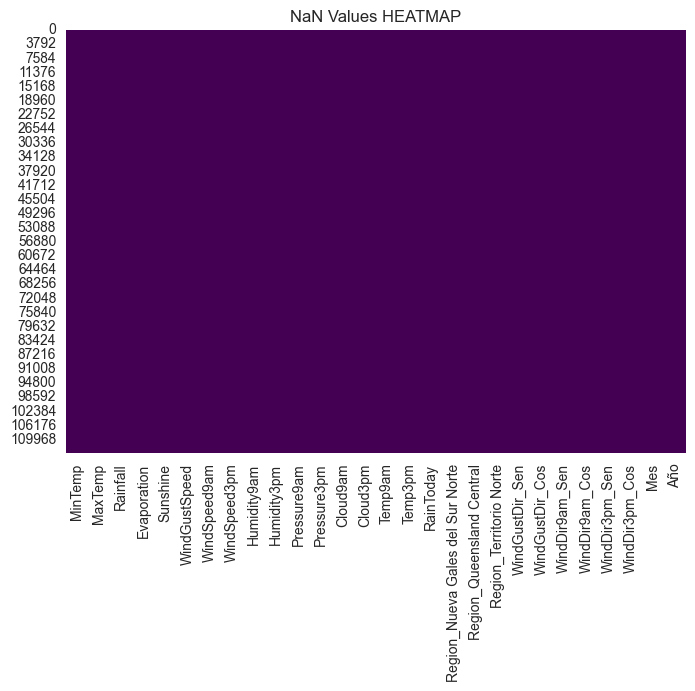

In [97]:
# Corroboramos que no hay valores faltantes en nuestro dataset de entrenamiento ya escalado.
sns.heatmap(X_train_scaled.isnull(), cbar=False, cmap='viridis')
plt.title('NaN Values HEATMAP')
plt.show()

Podemos confirmar que ya no tenemos valores faltantes en nuestro dataset de entrenamiento. Completamos los valores nulos utilizando estrategias de imputación basadas en la distribución de cada variable:

Media: para variables con distribuciones más gaussianas.
Mediana: para variables con sesgos hacia alguno de los extremos.
Moda: para variables con valores concentrados en un rango pequeño.
KNN: para variables cíclicas, como las direcciones del viento o las horas, aprovechando la relación con sus vecinos más cercanos.
Finalmente, escalamos los datos utilizando StandardScaler(), asegurando que todas las características están en una escala comparable, lo que es esencial para mejorar el rendimiento de los modelos predictivos.

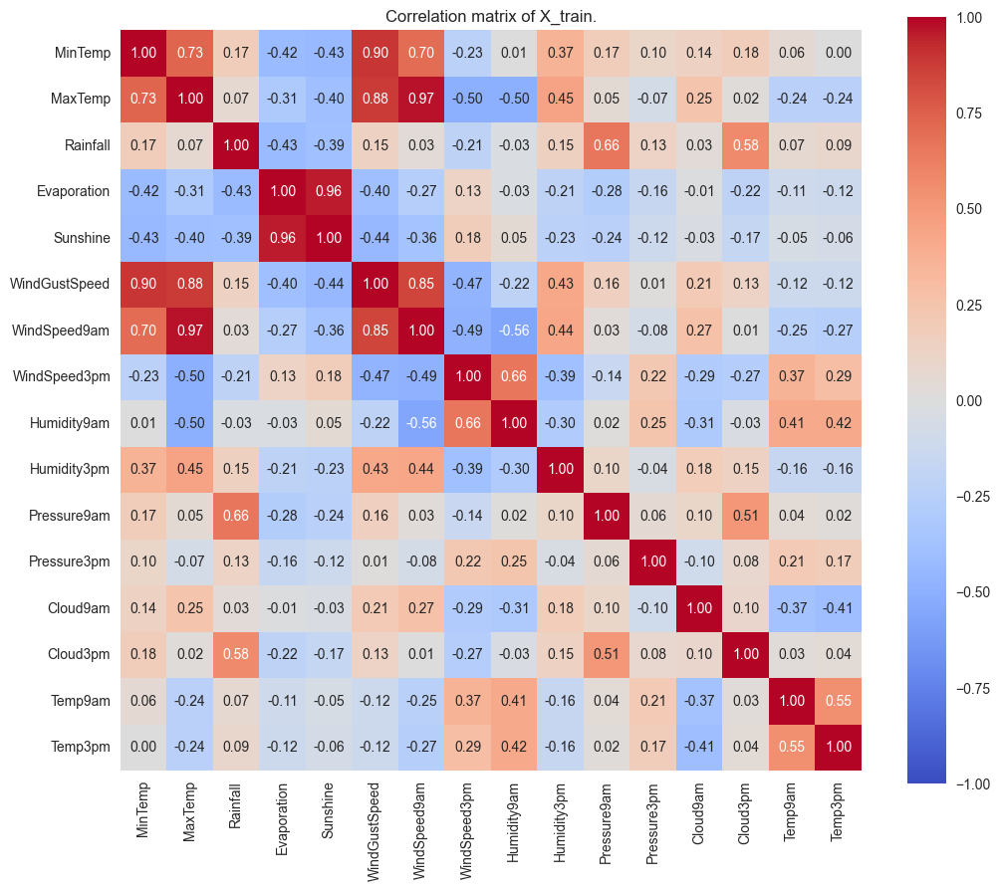

In [98]:
# Mostramos la relación positiva, negativa o nula entre las columnas seleccionadas de X_train.
# No seleccionamos todas las columnas, ya que las variables dummy no aportan información relevante a la correlación,
# pues sus valores tienden a estar cerca de 0.
corr_train = X_train_scaled[['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm']].corr()

# Configuramos la visualización de la matriz de correlación.
plt.figure(figsize=(12, 10))
sns.heatmap(corr_train, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0,square=True,fmt='.2f',annot_kws = {'size':10})
plt.title('Correlation matrix of X_train.')
plt.show()

# CORREGIR Y ELIMIINAR LAS CATEGORICAS


Conclusión: vemos un análisis parecido al del pairplot.

# Ejercicio 3

In [99]:
def metricas (y_test, y_pred):
  '''
  Calculamos métricas básicas de evaluación.
  Estas métricas son útiles para entender la proporción de verdaderos positivos (VP)
  y verdaderos negativos (VN) en las predicciones del modelo.
  '''
  accuracy = accuracy_score(y_test, y_pred)
  precision = precision_score(y_test, y_pred)
  recall = recall_score(y_test, y_pred)
  f1 = f1_score(y_test, y_pred)

  #-------------------------------------------------------------------------------------------------------------------------------

  # Balanced Accuracy: promedio entre la sensibilidad para las clases positiva y negativa.
  balanced_accuracy = balanced_accuracy_score(y_test, y_pred)

  #-------------------------------------------------------------------------------------------------------------------------------

  # Especificidad: proporción de verdaderos negativos entre todos los negativos reales.
  # En sklearn, esto se calcula como el recall para la clase negativa (etiquetada como 0).
  specificity = recall_score(y_test, y_pred, pos_label=0)

  #-------------------------------------------------------------------------------------------------------------------------------

  # Matriz de Confusión: muestra los verdaderos positivos, negativos y los errores del modelo.
  conf_matrix = confusion_matrix(y_test, y_pred)
  disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=["No Lluvia", "Lluvia"])
  disp.plot(cmap='Blues')
  plt.title("Matriz de Confusión")
  plt.show()

  #-------------------------------------------------------------------------------------------------------------------------------

  # Mostramos todas las métricas calculadas.
  print(f"Balanced Accuracy: {balanced_accuracy:.4f}")
  print(f"Especificidad (Specificity): {specificity:.4f}")
  print(f"Exactitud (Accuracy): {accuracy:.4f}")
  print(f"Precisión (Precision): {precision:.4f}")
  print(f"Sensibilidad (Recall): {recall:.4f}")
  print(f"F1 Score: {f1:.4f}")

  # Mostramos el reporte de clasificación, que incluye métricas adicionales por clase.
  print("Reporte de Clasificación:")
  print(classification_report(y_test, y_pred))


In [100]:
def ROC_AUC(X_test_scaled, y_test, modelo_entrenado):
  """
    Calcula y grafica la curva ROC junto con el área bajo la curva (AUC).

    Args:
    X_test_scaled: Conjunto de características de prueba escaladas.
    y_test: Valores reales de la clase objetivo en el conjunto de prueba.
    modelo_entrenado: Modelo previamente entrenado que será evaluado.

    Returns:
    fpr: Tasa de falsos positivos (False Positive Rate) en diferentes umbrales.
    tpr: Tasa de verdaderos positivos (True Positive Rate) en diferentes umbrales.
    thresholds: Umbrales utilizados para calcular FPR y TPR.
  """

  # Calculamos las probabilidades predichas para la clase positiva (1).
  y_pred_proba = modelo_entrenado.predict_proba(X_test_scaled)[:, 1]

  # Calculamos las tasas FPR (False Positive Rate) y TPR (True Positive Rate), así como los umbrales correspondientes.
  fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

  # Calculamos el área bajo la curva (AUC).
  roc_auc = auc(fpr, tpr)

  # Graficamos la curva ROC
  plt.figure(figsize=(6, 4))
  plt.plot(fpr, tpr, color='darkorange', lw=2, label='Curva ROC (AUC = %0.2f)' % roc_auc)
  plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.05])
  plt.xlabel('Tasa de Falsos Positivos (FPR)')
  plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
  plt.title('Curva ROC')
  plt.legend(loc="lower right")
  plt.show()
  return fpr, tpr, thresholds

## Modelo de Regresión Logística binario

In [101]:
# Inicializamos y entrenamos un modelo de regresión logística.
# Usamos random_state=42 para garantizar la reproducibilidad de los resultados.
model = LogisticRegression(random_state=42)
model.fit(X_train_scaled, y_train)

# Realizamos las predicciones en el conjunto de prueba.
y_pred = model.predict(X_test_scaled)

In [102]:
MODELO_LOGISTICO = model

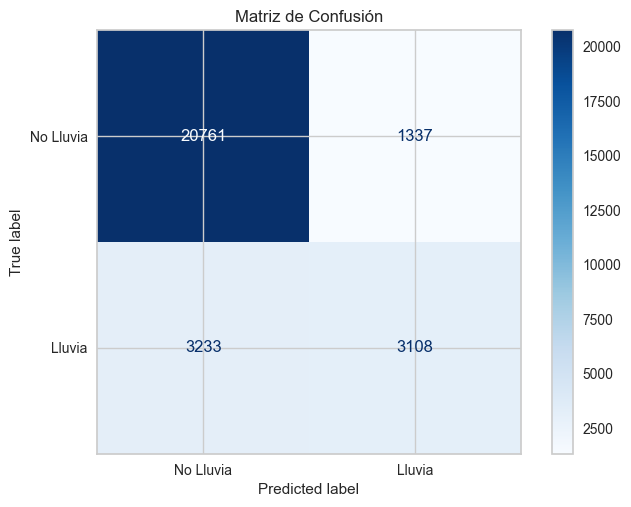

Balanced Accuracy: 0.7148
Especificidad (Specificity): 0.9395
Exactitud (Accuracy): 0.8393
Precisión (Precision): 0.6992
Sensibilidad (Recall): 0.4901
F1 Score: 0.5763
Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.87      0.94      0.90     22098
           1       0.70      0.49      0.58      6341

    accuracy                           0.84     28439
   macro avg       0.78      0.71      0.74     28439
weighted avg       0.83      0.84      0.83     28439



In [103]:
metricas(y_test, y_pred)

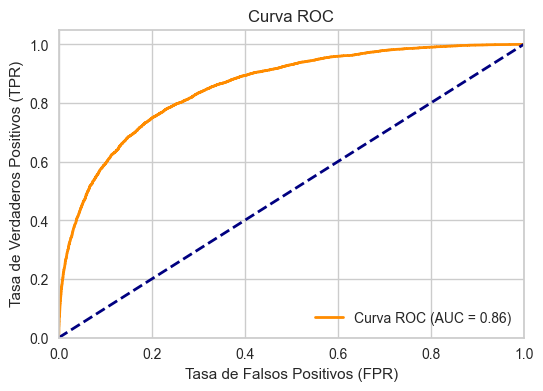

In [104]:
fpr_model, tpr_model, thresholds_model = ROC_AUC(X_test_scaled, y_test, model)

In [105]:
# Calculamos el umbral óptimo
optimal_idx_model = np.argmax(tpr_model - fpr_model)
optimal_threshold_model = thresholds_model[optimal_idx_model]

print("Umbral óptimo:", optimal_threshold_model)

Umbral óptimo: 0.23780065326986907


## Modelo con muestreo balanceado

In [106]:
# Modelo con muestreo de clase
logistic_class_weight = LogisticRegression(class_weight='balanced')
logistic_class_weight.fit(X_train_scaled, y_train)

# Evaluación
y_pred_balanced= logistic_class_weight.predict(X_test_scaled)

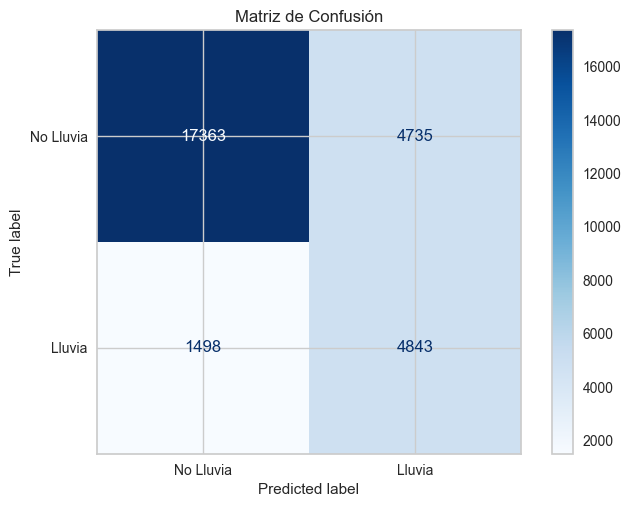

Balanced Accuracy: 0.7747
Especificidad (Specificity): 0.7857
Exactitud (Accuracy): 0.7808
Precisión (Precision): 0.5056
Sensibilidad (Recall): 0.7638
F1 Score: 0.6085
Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.92      0.79      0.85     22098
           1       0.51      0.76      0.61      6341

    accuracy                           0.78     28439
   macro avg       0.71      0.77      0.73     28439
weighted avg       0.83      0.78      0.79     28439



In [107]:
metricas(y_test, y_pred_balanced)

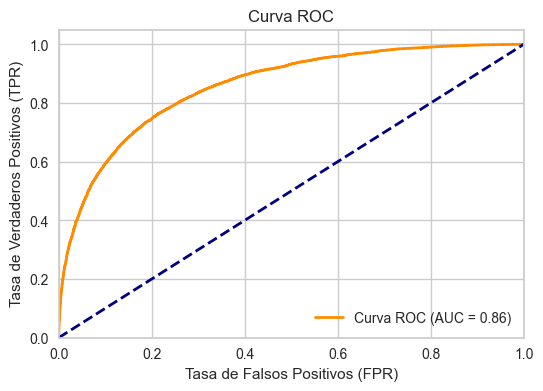

In [108]:
fpr_balanced, tpr_balanced, thresholds_balanced = ROC_AUC(X_test_scaled, y_test, logistic_class_weight)

In [109]:
# Calculamos el umbral óptimo
optimal_idx_balanced = np.argmax(tpr_balanced - fpr_balanced)
optimal_threshold_balanced = thresholds_balanced[optimal_idx_balanced]

print("Umbral óptimo:", optimal_threshold_balanced)

Umbral óptimo: 0.498904094780325


## Modelo de Regresión Logística con Oversampling

# REVISAR BIEN EL OVERSAMPLING

In [110]:
# Remuestreo con Oversampling (RandomOverSampler)
# https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.RandomOverSampler.html

oversampler = RandomOverSampler(random_state=42)
X_resampled, y_resampled = oversampler.fit_resample(X_train_scaled, y_train)
len(y_resampled[y_resampled==1]), len(y_resampled[y_resampled==0])

# Modelo con muestreo de clase
logistic_oversampler = LogisticRegression()
logistic_oversampler.fit(X_resampled, y_resampled)

# Evaluación
y_pred_over = logistic_oversampler.predict(X_test_scaled)

In [111]:
MODELO_LOGISTICO_OVERSAMPLER = logistic_oversampler

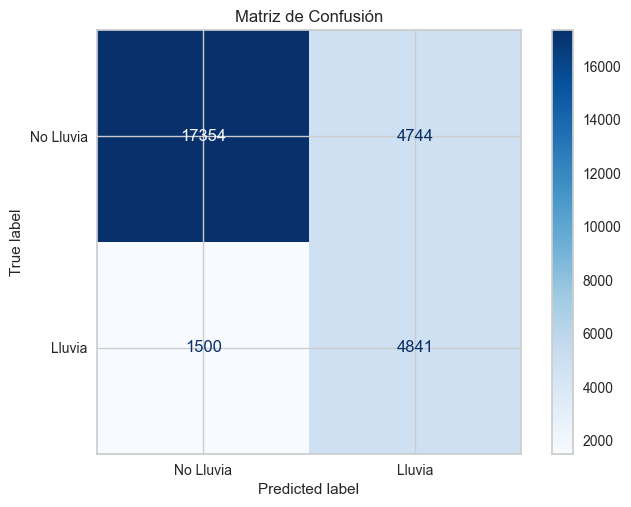

Balanced Accuracy: 0.7744
Especificidad (Specificity): 0.7853
Exactitud (Accuracy): 0.7804
Precisión (Precision): 0.5051
Sensibilidad (Recall): 0.7634
F1 Score: 0.6079
Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.92      0.79      0.85     22098
           1       0.51      0.76      0.61      6341

    accuracy                           0.78     28439
   macro avg       0.71      0.77      0.73     28439
weighted avg       0.83      0.78      0.79     28439



In [112]:
metricas(y_test, y_pred_over)

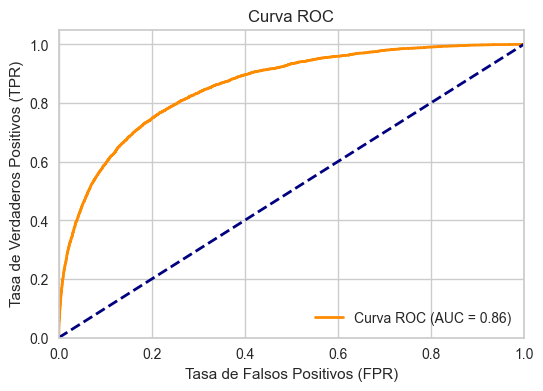

In [113]:
fpr_over, tpr_over, thresholds_over = ROC_AUC(X_test_scaled, y_test, logistic_oversampler)

In [114]:
# Calculamos el umbral óptimo
optimal_idx_over = np.argmax(tpr_over - fpr_over)
optimal_threshold_over = thresholds_over[optimal_idx_over]

print("Umbral óptimo:", optimal_threshold_over)

Umbral óptimo: 0.49549484359144547


# Ejercicio 4 CORREGIR


### Modelo base


In [115]:
y_pred_random_np = np.random.randint(2, size=len(list(y_test)))

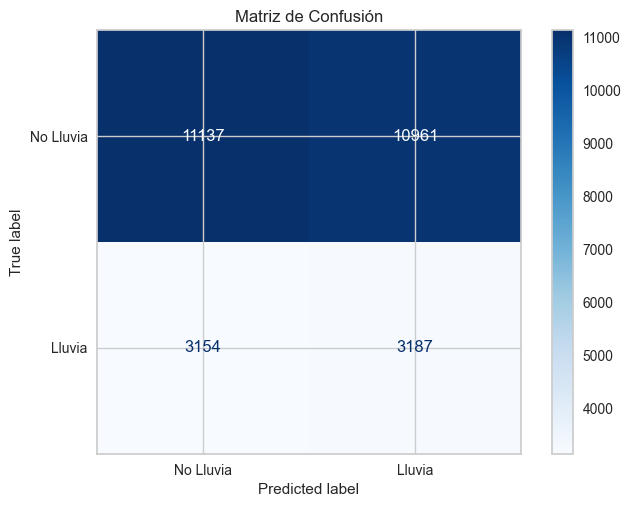

Balanced Accuracy: 0.5033
Especificidad (Specificity): 0.5040
Exactitud (Accuracy): 0.5037
Precisión (Precision): 0.2253
Sensibilidad (Recall): 0.5026
F1 Score: 0.3111
Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.78      0.50      0.61     22098
           1       0.23      0.50      0.31      6341

    accuracy                           0.50     28439
   macro avg       0.50      0.50      0.46     28439
weighted avg       0.66      0.50      0.54     28439



In [116]:
metricas(y_test, y_pred_random_np)

# Ejercicio 5



In [117]:
warnings.filterwarnings("ignore")

# Definimos el modelo
modelo_1 = LogisticRegression(class_weight='balanced', random_state=42)

# Configuración de validación cruzada k-fold
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Evaluación inicial usando validación cruzada k-fold para el modelo base
base_scores = cross_val_score(modelo_1, X_train_scaled, y_train, cv=kfold, scoring=make_scorer(f1_score))
print(f"F1 Score promedio del modelo base (validación cruzada k-fold): {base_scores.mean():.4f}")

#-------------------------------------------------------------------------------------------------------------------------------

# Hiperparámetros a optimizar
param_dist = {
    'C': [0.01,0.1,1,10,100],
    'solver': ['liblinear', 'saga', 'lbfgs', 'newton-cg', 'newton-cholesky', 'sag'],
    'penalty': ['elasticnet', 'l1', 'l2', 'none'],
    'class_weight':['balanced', 'dict', 'none'],
    'max_iter': [100,500,1000,5000,10000]

}

print('\n#--------------------------------------------------------------------------------------------------------------------------------------------------\n')
#-------------------------------------------------------------------------------------------------------------------------------

# 1. Grid Search para optimización de hiperparámetros
grid_search = GridSearchCV(estimator=modelo_1, param_grid=param_dist, cv=kfold, scoring=make_scorer(f1_score))
grid_search.fit(X_train_scaled, y_train)
print(f"Mejores hiperparámetros (Grid Search): {grid_search.best_params_}")
print(f"Mejor F1 Score (Grid Search): {grid_search.best_score_:.4f}")

print('\n#--------------------------------------------------------------------------------------------------------------------------------------------------\n')
#-------------------------------------------------------------------------------------------------------------------------------

# 2. Random Search para optimización de hiperparámetros
random_search = RandomizedSearchCV(estimator=modelo_1, param_distributions=param_dist, cv=kfold, n_iter=10, scoring=make_scorer(f1_score), random_state=42)
random_search.fit(X_train_scaled, y_train)
print(f"Mejores hiperparámetros (Random Search): {random_search.best_params_}")
print(f"Mejor F1 Score (Random Search): {random_search.best_score_:.4f}")

print('\n#--------------------------------------------------------------------------------------------------------------------------------------------------\n')
#-------------------------------------------------------------------------------------------------------------------------------

# 3. Optuna para optimización de hiperparámetros
def objective(trial):
    C = trial.suggest_loguniform('C', 1e-3, 1e2)
    solver = trial.suggest_categorical('solver', ['liblinear', 'saga'])
    penalty = trial.suggest_categorical('penalty', ['l1', 'l2']) if solver != 'liblinear' else 'l2'

    model = LogisticRegression(C=C, solver=solver, penalty=penalty, class_weight='balanced', random_state=42)
    scores = cross_val_score(model, X_train_scaled, y_train, cv=kfold, scoring=make_scorer(f1_score))
    return scores.mean()

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=20)
print(f"Mejores hiperparámetros (Optuna): {study.best_params}")
print(f"Mejor F1 Score (Optuna): {study.best_value:.4f}")

F1 Score promedio del modelo base (validación cruzada k-fold): 0.6153

#--------------------------------------------------------------------------------------------------------------------------------------------------

Mejores hiperparámetros (Grid Search): {'C': 10, 'class_weight': 'balanced', 'max_iter': 100, 'penalty': 'l2', 'solver': 'lbfgs'}
Mejor F1 Score (Grid Search): 0.6154

#--------------------------------------------------------------------------------------------------------------------------------------------------



[I 2025-06-18 18:57:48,875] A new study created in memory with name: no-name-067c5383-9530-4893-89c8-d66b1d494246


Mejores hiperparámetros (Random Search): {'solver': 'newton-cg', 'penalty': 'l2', 'max_iter': 100, 'class_weight': 'balanced', 'C': 10}
Mejor F1 Score (Random Search): 0.6153

#--------------------------------------------------------------------------------------------------------------------------------------------------



[I 2025-06-18 18:57:52,733] Trial 0 finished with value: 0.6153691358279889 and parameters: {'C': 89.83027843827696, 'solver': 'liblinear'}. Best is trial 0 with value: 0.6153691358279889.
[I 2025-06-18 18:57:56,727] Trial 1 finished with value: 0.6151106879817542 and parameters: {'C': 0.07148122871146165, 'solver': 'saga', 'penalty': 'l1'}. Best is trial 0 with value: 0.6153691358279889.
[I 2025-06-18 18:58:00,110] Trial 2 finished with value: 0.6153596366895183 and parameters: {'C': 73.57660206642046, 'solver': 'saga', 'penalty': 'l2'}. Best is trial 0 with value: 0.6153691358279889.
[I 2025-06-18 18:58:03,751] Trial 3 finished with value: 0.615276563791727 and parameters: {'C': 0.23378671975459311, 'solver': 'saga', 'penalty': 'l1'}. Best is trial 0 with value: 0.6153691358279889.
[I 2025-06-18 18:58:06,236] Trial 4 finished with value: 0.6149088941912336 and parameters: {'C': 0.02160456179855524, 'solver': 'liblinear'}. Best is trial 0 with value: 0.6153691358279889.
[I 2025-06-18 

Mejores hiperparámetros (Optuna): {'C': 89.83027843827696, 'solver': 'liblinear'}
Mejor F1 Score (Optuna): 0.6154


# Ejercicio 6

In [118]:
# El mejor modelo es el balnceado ya que tiene menos falso positivos y falsos negativos.
# EXPLICAR MEJOR POR LAS DUDAS PORQUE LAS METRICAS SON MEJOR DEL BALANCEADO.
nom_columns = X_train_scaled.columns
# Crea un objeto explainer SHAP con el modelo que tiene oversampler.
shap_oversampling = shap.LinearExplainer(logistic_oversampler, X_train_scaled_shap, feature_names=nom_columns)

# Crea un objeto explainer SHAP con el modelo que tiene la clase balanceada (los pesos de la pre3diccion de lluvia).
shap_balanceado = shap.LinearExplainer(logistic_class_weight, X_train_scaled_shap, feature_names=nom_columns)

In [119]:
# Calcula los valores SHAP para un conjunto de ejemplos de prueba con el modelo de oversampling
shap_values_oversampling = shap_oversampling.shap_values(X_test_scaled_shap)

# Calcula los valores SHAP para un conjunto de ejemplos de prueba con el modelo balanceado (los pesos de la prediccion de lluvia)
shap_values_balanceado = shap_balanceado.shap_values(X_test_scaled_shap)

In [120]:
# La dimension del shap_values_balanceado
shape_values_balanceados = shap_values_balanceado.shape

values_balanceado_0 = shap_values_balanceado[0]

expected_shap_balanceado = shap_balanceado.expected_value # Guardar en variables y

In [121]:
# La dimension del shap_values_oversampling
shape_values_oversample = shap_values_oversampling.shape

values_oversample = shap_values_oversampling[0]

expected_shap_oversampling = shap_oversampling.expected_value

## Interpretabilidad local

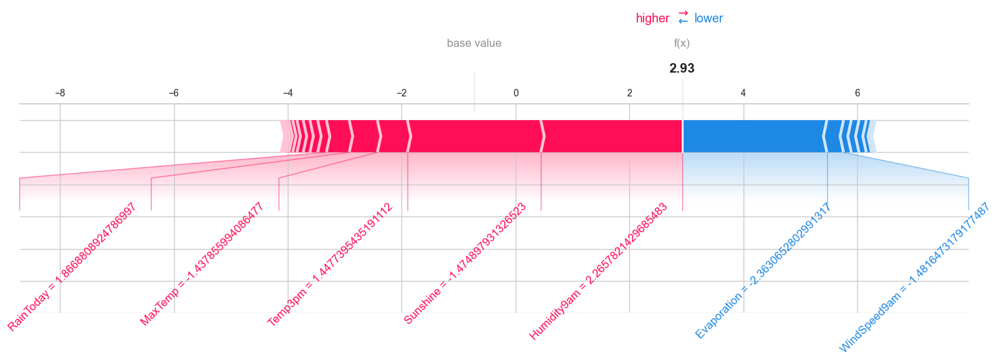

In [122]:
# grafico del OVERSAMPLIG
index= 0
shap.force_plot(shap_oversampling.expected_value, shap_values_oversampling[index], X_test_scaled.iloc[index],
                feature_names=nom_columns, matplotlib=True, figsize=(18, 4),
                text_rotation=45)

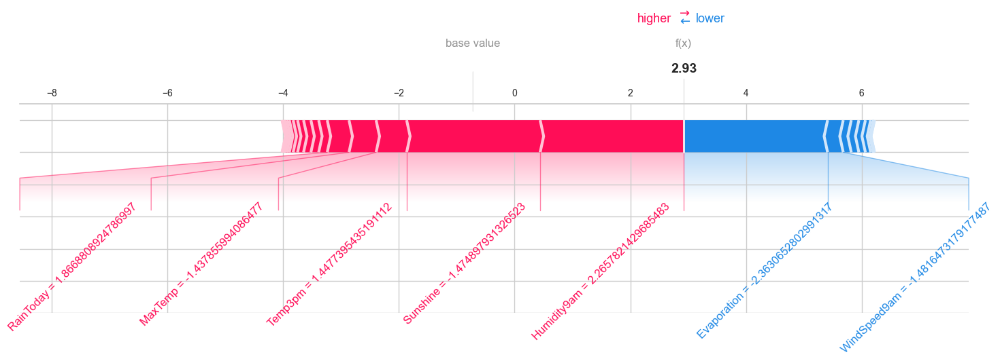

In [123]:
# grafico del OVERSAMPLIG
index=0

shap.force_plot(shap_balanceado.expected_value, shap_values_balanceado[index], X_test_scaled.iloc[index],
                feature_names=nom_columns, matplotlib=True, figsize=(18, 4),
                text_rotation=45)


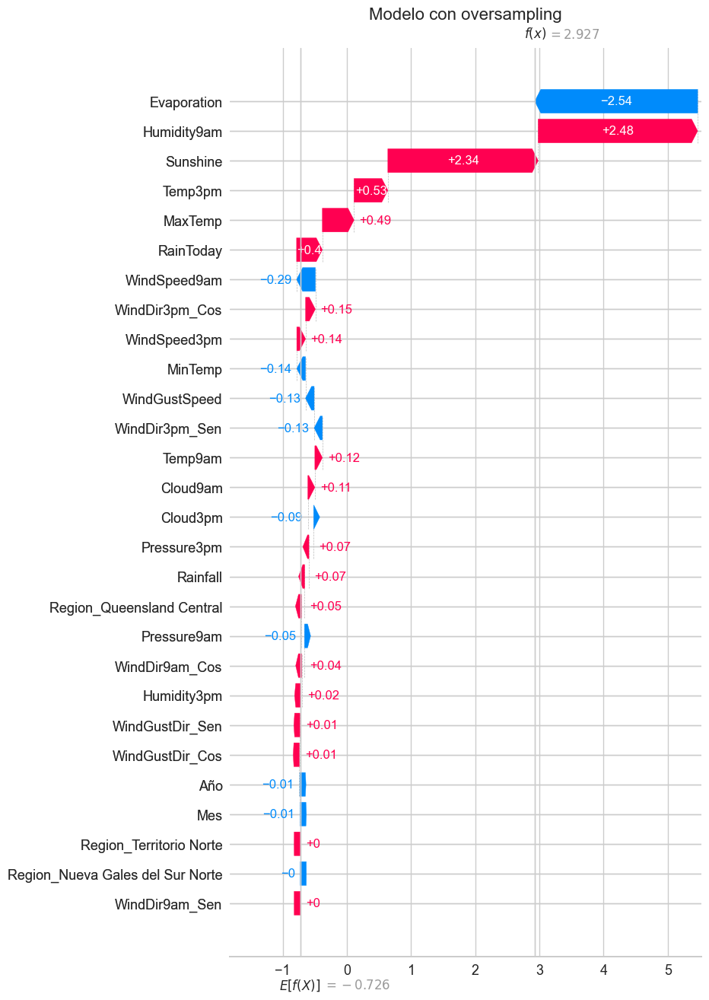

In [124]:
explanation = shap.Explanation(values=shap_values_oversampling[index], base_values=expected_shap_oversampling, feature_names=nom_columns)
plt.title("Modelo con oversampling", fontsize=16)
shap.plots.waterfall(explanation, max_display=35)

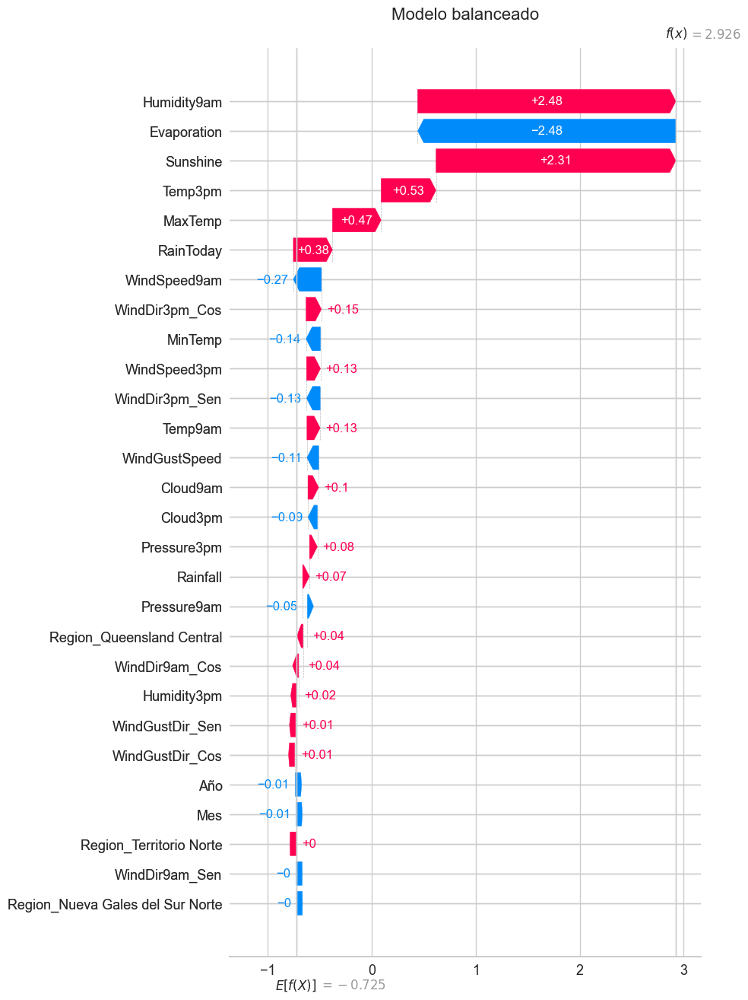

In [125]:
explanation_1 = shap.Explanation(values=shap_values_balanceado[index], base_values=expected_shap_balanceado, feature_names=nom_columns)
plt.title("Modelo balanceado", fontsize=16)
shap.plots.waterfall(explanation_1, max_display=35)

## Interpretabilidad global

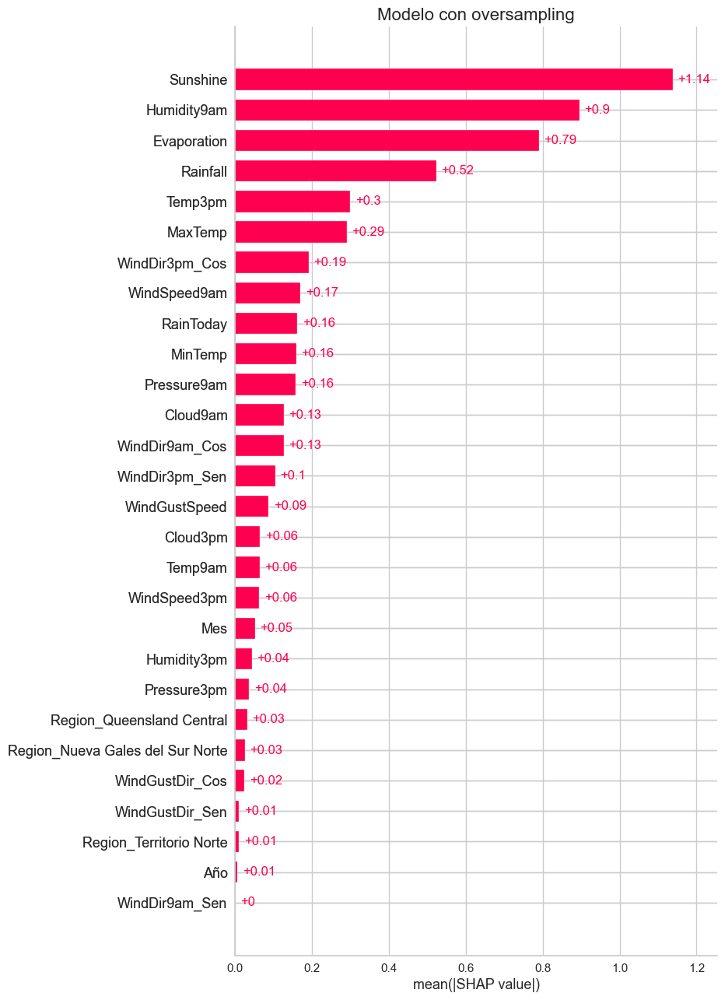

In [126]:
explanation = shap.Explanation(values=shap_values_oversampling, base_values=expected_shap_oversampling, feature_names=nom_columns, data=X_test_scaled_shap)
plt.title("Modelo con oversampling", fontsize=16)
shap.plots.bar(explanation, max_display=35)

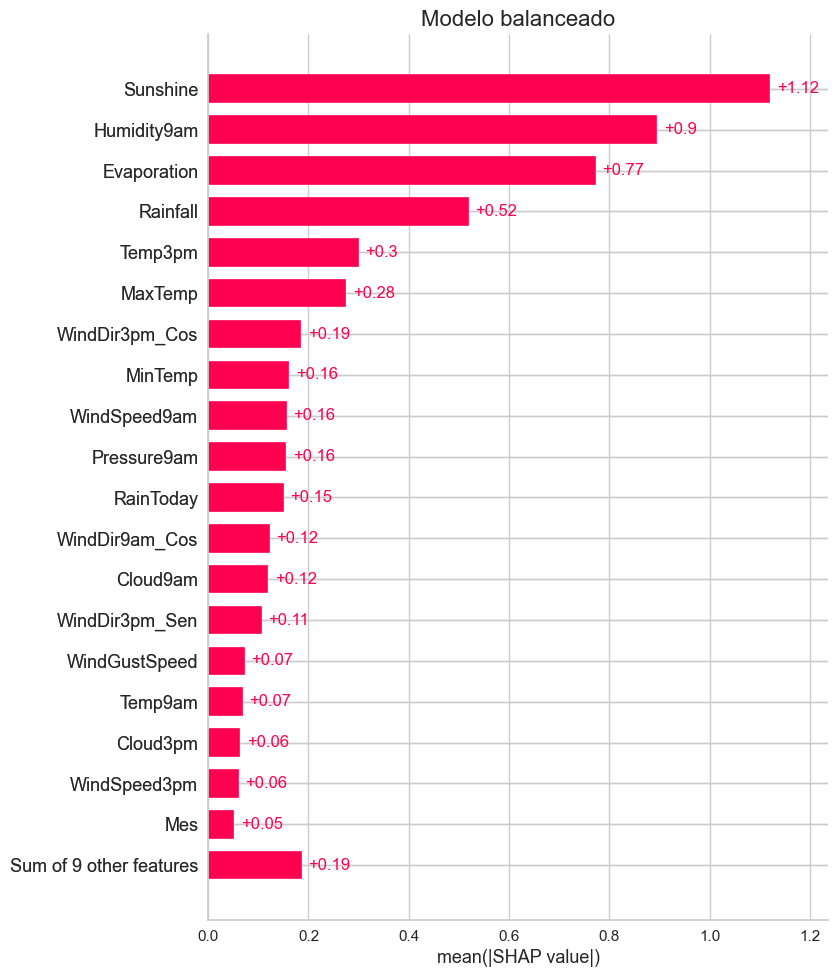

In [127]:
explanation_balanceado = shap.Explanation(values=shap_values_balanceado, base_values=expected_shap_balanceado, feature_names=nom_columns, data=X_test_scaled_shap)
plt.title("Modelo balanceado", fontsize=16)
shap.plots.bar(explanation_balanceado,max_display=20)

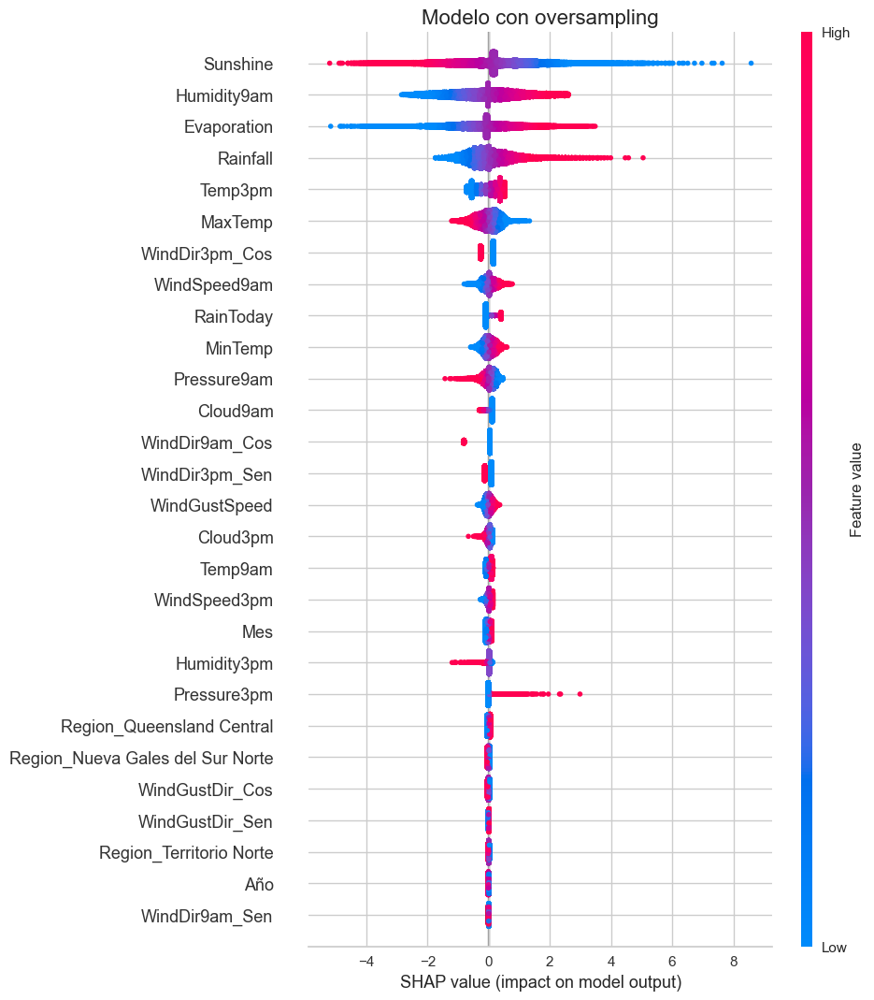

In [128]:
plt.title("Modelo con oversampling", fontsize=16)
shap.plots.beeswarm(explanation,max_display=35)

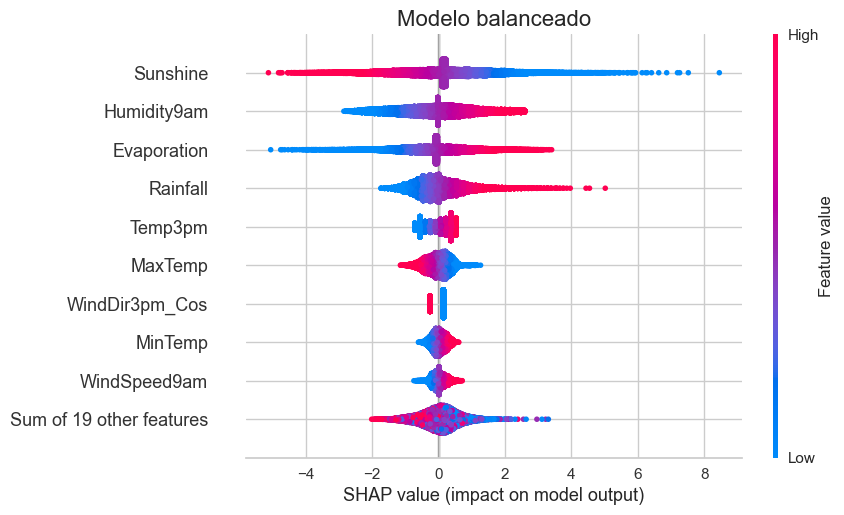

In [129]:
plt.title("Modelo balanceado", fontsize=16)
shap.plots.beeswarm(explanation_balanceado)

# Ejercicio 7

In [130]:
X = weather_depurado.drop('RainTomorrow', axis=1)
y = weather_depurado['RainTomorrow']
# Dividimos nuestro conjunto de datos en dos partes, la parte de entrenamiento y la parte de prueba.
# La division que hacemos de los datos son de 80/20, donde el 80 es para entrenamiento y el 20 restante para hacer un testeo.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Para hacer Regrecion Logistica
X_train = pd.DataFrame(X_train)
X_test = pd.DataFrame(X_test)

train_data = pd.concat([X_train, y_train], axis=1)

clf = setup(data=train_data, target='RainTomorrow', session_id=42, test_data=pd.concat([X_test, y_test], axis=1))

best_model = compare_models()

,Description,Value
0,Session id,42
1,Target,RainTomorrow
2,Target type,Binary
3,Original data shape,"(142193, 29)"
4,Transformed data shape,"(142193, 29)"
5,Transformed train set shape,"(113754, 29)"
6,Transformed test set shape,"(28439, 29)"
7,Numeric features,25
8,Rows with missing values,60.3%
9,Preprocess,True


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.8570,0.8895,0.5404,0.7527,0.6291,0.5435,0.5549,0.8500
et,Extra Trees Classifier,0.8561,0.8883,0.5018,0.7784,0.6102,0.5270,0.5461,3.2220
rf,Random Forest Classifier,0.8549,0.8862,0.5073,0.7677,0.6109,0.5263,0.5434,4.4060
gbc,Gradient Boosting Classifier,0.8498,0.8753,0.5060,0.7428,0.6020,0.5135,0.5278,5.4970
lr,Logistic Regression,0.8439,0.8656,0.4972,0.7208,0.5884,0.4961,0.5091,2.3470
lda,Linear Discriminant Analysis,0.8435,0.8644,0.5085,0.7121,0.5932,0.4996,0.5105,0.1740
ada,Ada Boost Classifier,0.8426,0.8638,0.4931,0.7173,0.5844,0.4914,0.5045,1.1780
ridge,Ridge Classifier,0.8424,0.8644,0.4443,0.7524,0.5586,0.4704,0.4946,0.1210
knn,K Neighbors Classifier,0.8344,0.8165,0.5052,0.6753,0.5780,0.4776,0.4854,2.6240
qda,Quadratic Discriminant Analysis,0.8278,0.8448,0.5524,0.6336,0.5902,0.4818,0.4836,0.1370


# Ejercicio 8

In [131]:
# Crear el modelo Red Neuronal
MODELO_RN = Sequential()
MODELO_RN.add(Dense(48, activation='relu', input_shape=(X_train_scaled.shape[1],)))  # Capa de entrada
MODELO_RN.add(Dense(10, activation='relu'))  # Capa oculta
MODELO_RN.add(Dense(1, activation='sigmoid'))  # Capa de salida para clasificación binaria

# Compilar el modelo
MODELO_RN.compile(optimizer='Adam', loss='binary_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo
history = MODELO_RN.fit(X_train_scaled, y_train, epochs=20, batch_size=32, validation_split=0.2)

# Evaluacion del modelo
loss, accuracy = MODELO_RN.evaluate(X_test_scaled, y_test)
print(f'Accuracy: {accuracy:.4f}')

y_pred = MODELO_RN.predict(X_test_scaled)
print(y_pred)
y_pred = np.array(y_pred)
y_pred = np.round(y_pred)
f1 = f1_score(y_test, y_pred)
print(f1)

Epoch 1/20
2844/2844 ━━━━━━━━━━━━━━━━━━━━ 2s 565us/step - accuracy: 0.8219 - loss: 0.4022 - val_accuracy: 0.8466 - val_loss: 0.3539
Epoch 2/20
2844/2844 ━━━━━━━━━━━━━━━━━━━━ 2s 609us/step - accuracy: 0.8481 - loss: 0.3521 - val_accuracy: 0.8480 - val_loss: 0.3470
Epoch 3/20
2844/2844 ━━━━━━━━━━━━━━━━━━━━ 2s 556us/step - accuracy: 0.8507 - loss: 0.3456 - val_accuracy: 0.8508 - val_loss: 0.3463
Epoch 4/20
2844/2844 ━━━━━━━━━━━━━━━━━━━━ 2s 710us/step - accuracy: 0.8532 - loss: 0.3393 - val_accuracy: 0.8521 - val_loss: 0.3423
Epoch 5/20
2844/2844 ━━━━━━━━━━━━━━━━━━━━ 2s 571us/step - accuracy: 0.8571 - loss: 0.3324 - val_accuracy: 0.8501 - val_loss: 0.3434
Epoch 6/20
2844/2844 ━━━━━━━━━━━━━━━━━━━━ 2s 566us/step - accuracy: 0.8539 - loss: 0.3360 - val_accuracy: 0.8531 - val_loss: 0.3406
Epoch 7/20
2844/2844 ━━━━━━━━━━━━━━━━━━━━ 2s 620us/step - accuracy: 0.8561 - loss: 0.3331 - val_accuracy: 0.8534 - val_loss: 0.3416
Epoch 8/20
2844/2844 ━━━━━━━━━━━━━━━━━━━━ 2s 798us/step - accuracy: 0.8599 -

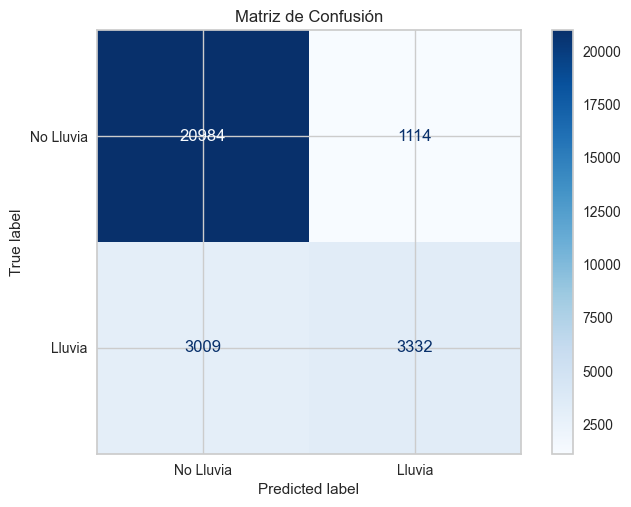

Balanced Accuracy: 0.7375
Especificidad (Specificity): 0.9496
Exactitud (Accuracy): 0.8550
Precisión (Precision): 0.7494
Sensibilidad (Recall): 0.5255
F1 Score: 0.6178
Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.87      0.95      0.91     22098
           1       0.75      0.53      0.62      6341

    accuracy                           0.86     28439
   macro avg       0.81      0.74      0.76     28439
weighted avg       0.85      0.86      0.85     28439



In [132]:
metricas(y_test, y_pred)

In [ ]:
# Optimización bayesiana

def create_model(optimizer='Adam', epochs=50, batch_size=32, neurons_1=32, neurons_2=16):
    # Crea el modelo de Keras
    model = Sequential()
    model.add(Dense(neurons_1, activation='relu', input_shape=(X_train_scaled.shape[1],)))
    model.add(Dense(neurons_2, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))

    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy']) 
    return model

def objective(params):
    # Desempaqueta los parámetros
    optimizer, epochs, batch_size, neurons_1, neurons_2 = params
    print(f"OPT: {params[0]} EPC: {params[1]} BTC: {params[2]} NEU1: {params[3]} NEU2: {params[4]}")
    # Crea el modelo con los parámetros actuales
    model = create_model(optimizer, epochs, batch_size, neurons_1, neurons_2)

    # Entrena el modelo
    history = model.fit(X_train_scaled, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, verbose=0)
    # Evaluación del modelo
    y_pred = model.predict(X_test_scaled)
    y_pred = np.array(y_pred)
    y_pred = np.round(y_pred)
    f1 = f1_score(y_test, y_pred)
    print(f1)
    return -f1  # Negativo para maximizar

# Espacio de búsqueda
space = [
    ('Adam', 'SGD'),
    (20, 50),
    (16, 32),
    (10, 50),
    (10, 50)
]

# Optimización bayesiana
result = gp_minimize(objective, space, n_calls=50, random_state=42)

OPT: SGD EPC: 26 BTC: 28 NEU1: 34 NEU2: 28
889/889 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step
0.6330686917500863
OPT: Adam EPC: 34 BTC: 21 NEU1: 16 NEU2: 36
889/889 ━━━━━━━━━━━━━━━━━━━━ 0s 264us/step
0.6189995410738871
OPT: Adam EPC: 42 BTC: 31 NEU1: 10 NEU2: 50
889/889 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step
0.6071261572991676
OPT: SGD EPC: 38 BTC: 16 NEU1: 11 NEU2: 31
889/889 ━━━━━━━━━━━━━━━━━━━━ 0s 427us/step
0.6180886769122064
OPT: Adam EPC: 21 BTC: 32 NEU1: 19 NEU2: 14


In [ ]:
# Los mejores parámetros
print("Mejores parámetros:", result.x)

optimizer, epochs, batch_size, neurons_1, neurons_2 = result.x

modelo_rn_best = create_model(optimizer,epochs,batch_size,neurons_1,neurons_2)
history = modelo_rn_best.fit(X_train_scaled, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, verbose=0)
MODELO_RN_OPTIMIZADO = modelo_rn_best

Mejores parámetros: ['Adam', 22, 16, 48, 49]


In [ ]:
X_reduced = X_test_scaled[:1000]

explainer = shap.Explainer(MODELO_RN, X_reduced)
explanation = explainer(X_reduced[:1000])

shap_values = explainer(X_reduced)

PermutationExplainer explainer: 1001it [00:25, 28.10it/s]                         
PermutationExplainer explainer: 1001it [00:20, 25.29it/s]                         


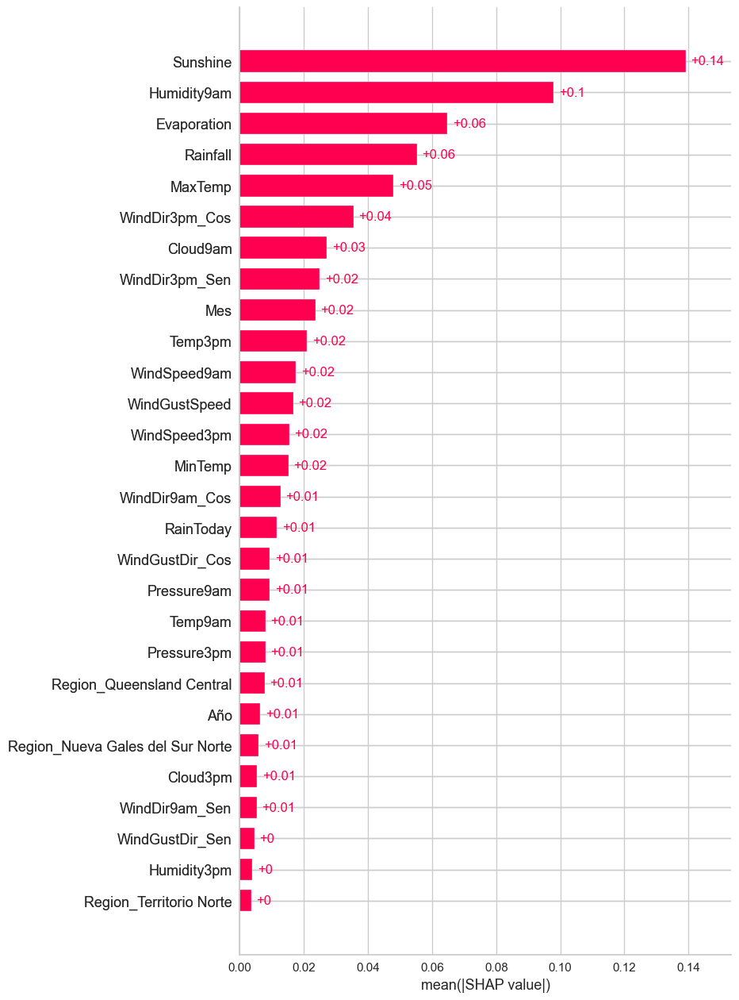

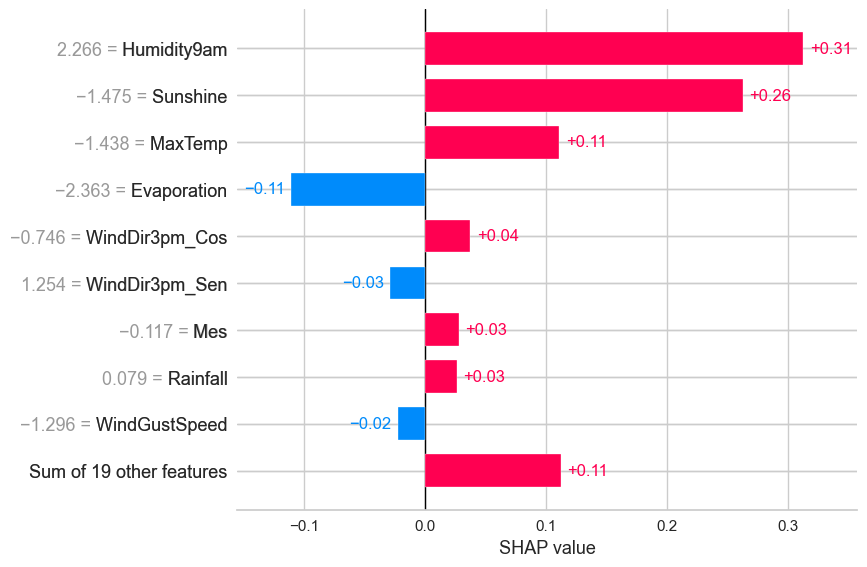

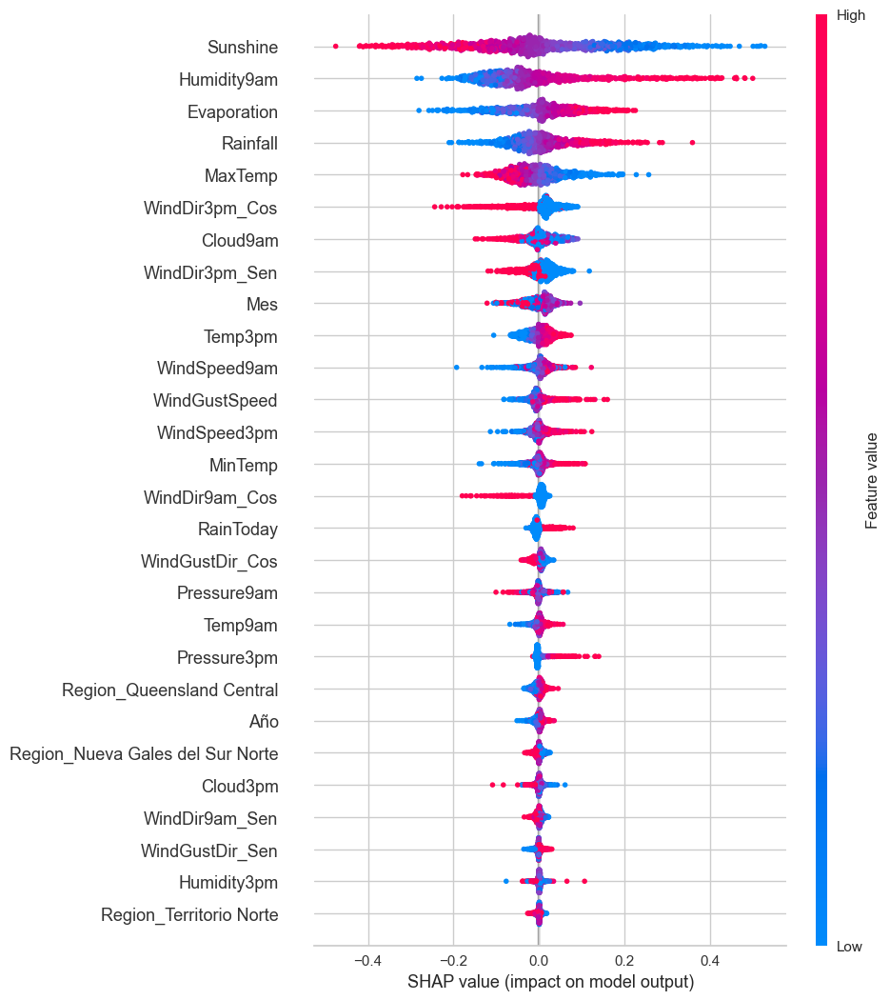

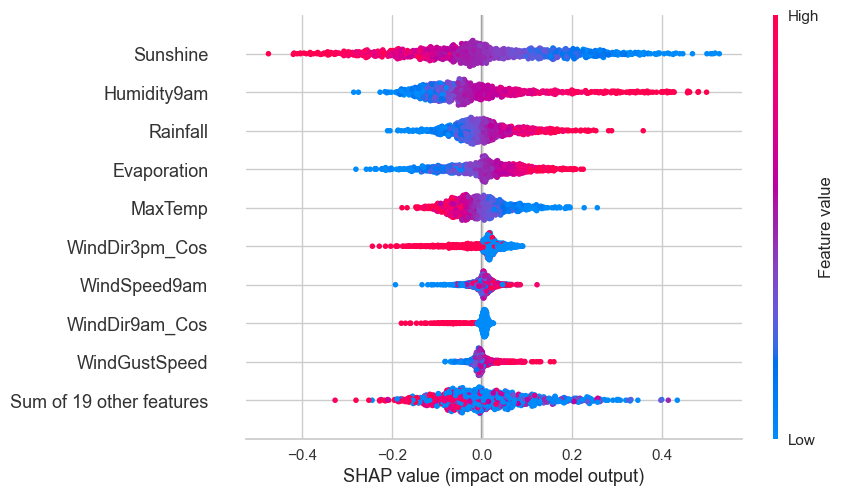

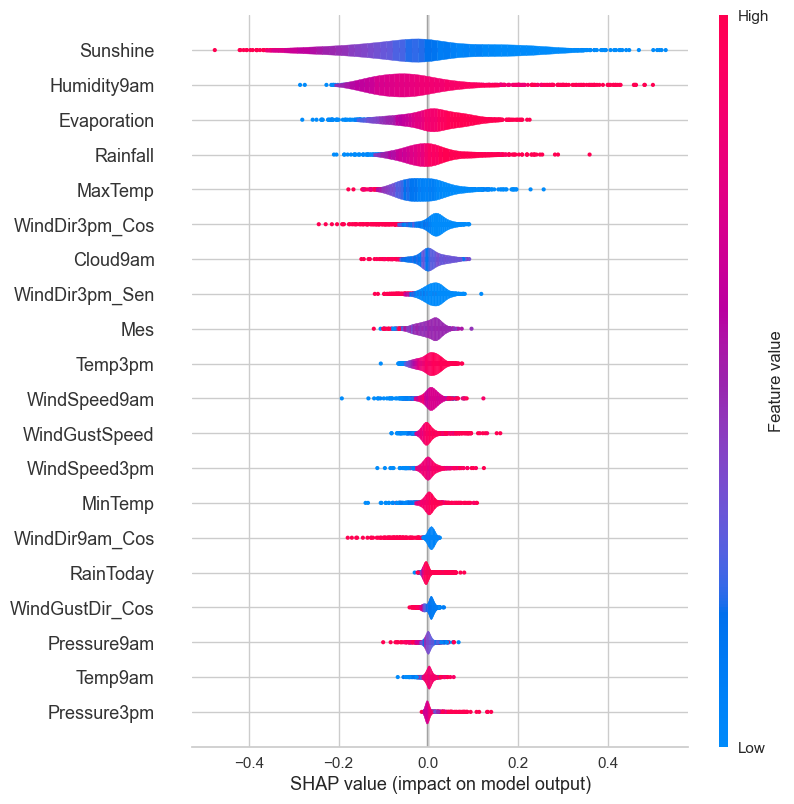

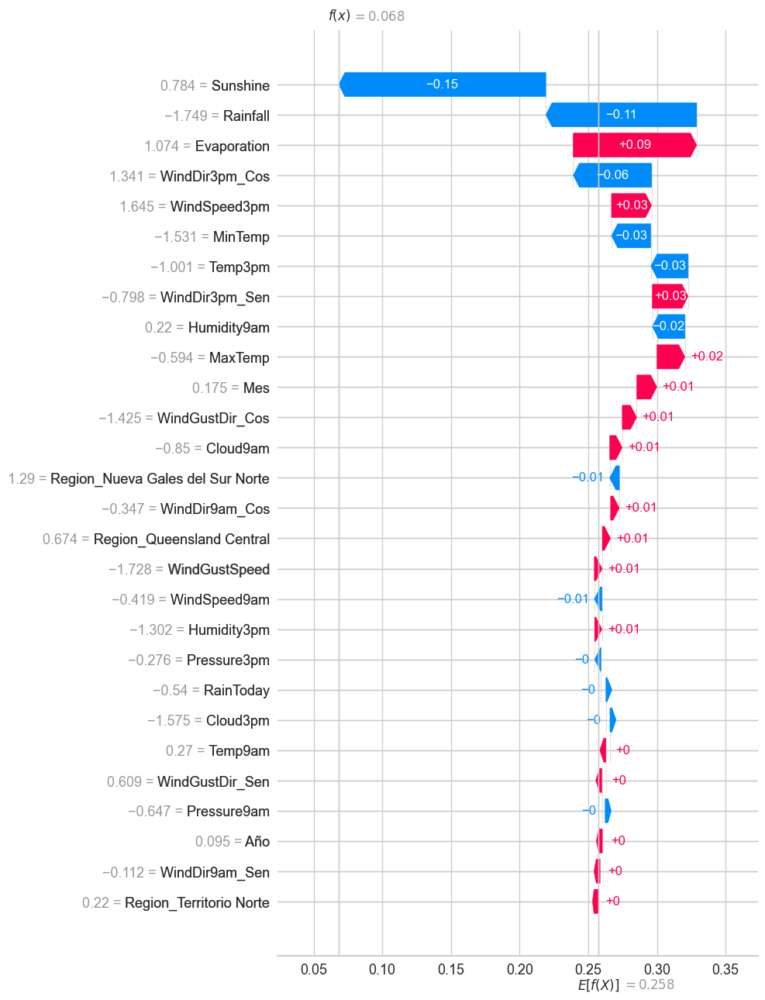

In [ ]:
# Visualización de los valores SHAP para el modelo de Red Neuronal
shap.plots.bar(shap_values, max_display=30)

# Visualización de los valores SHAP para el modelo de Red Neuronal
shap.plots.bar(shap_values[0])
plt.show()

shap.plots.beeswarm(shap_values, max_display=30) #order=shap_values.abs.mean(0) es el defecto
plt.show()

# Ordenar por el valos abs max, nos permite ver caracteristicas con alto impacto para individuos
shap.plots.beeswarm(shap_values, order=shap_values.abs.max(0))
plt.show()

# Violin plot para ver la distribución de los valores SHAP
shap.plots.violin(shap_values)

# Visualización de un gráfico de cascada para un ejemplo específico
shap.plots.waterfall(shap_values[5], max_display=30)
plt.show()

PermutationExplainer explainer: 28440it [10:37, 43.94it/s]                           


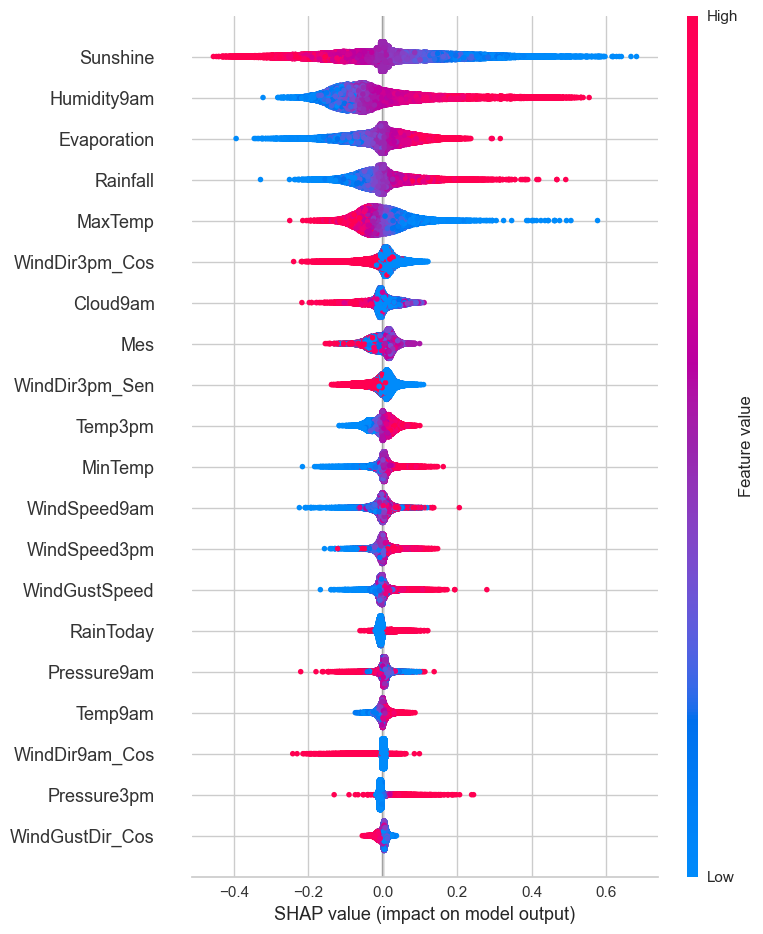

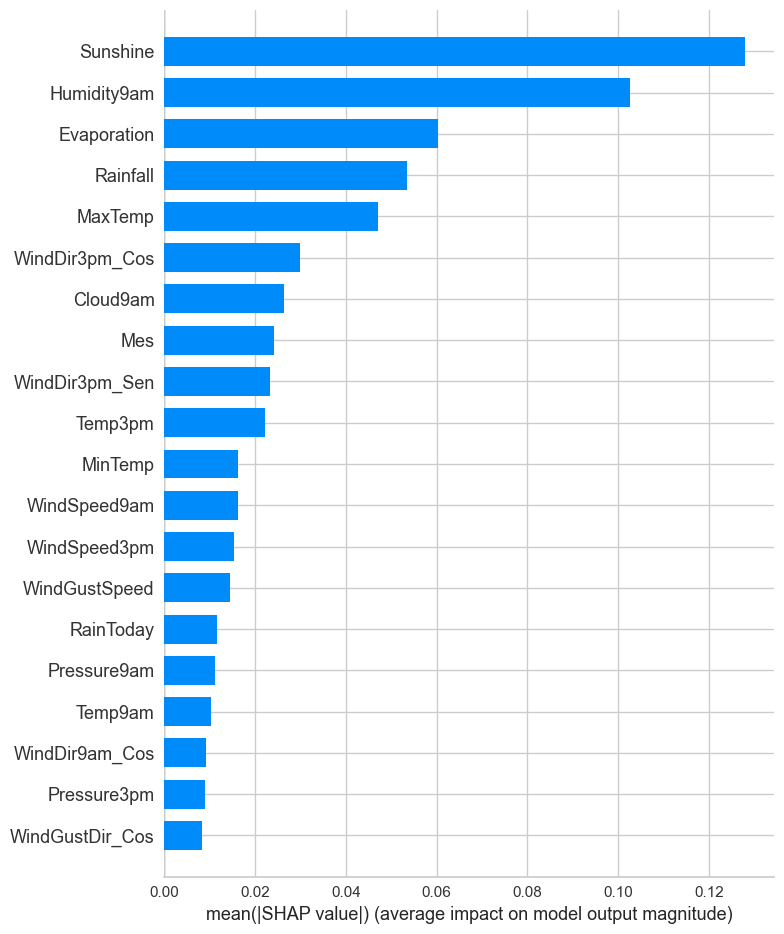

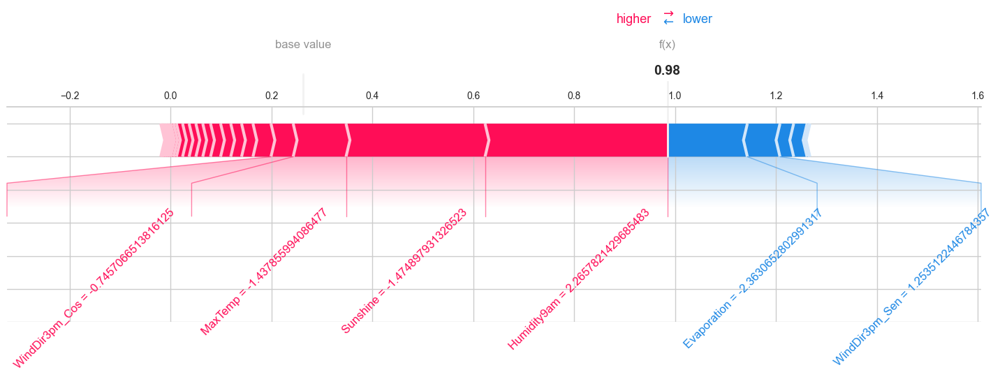

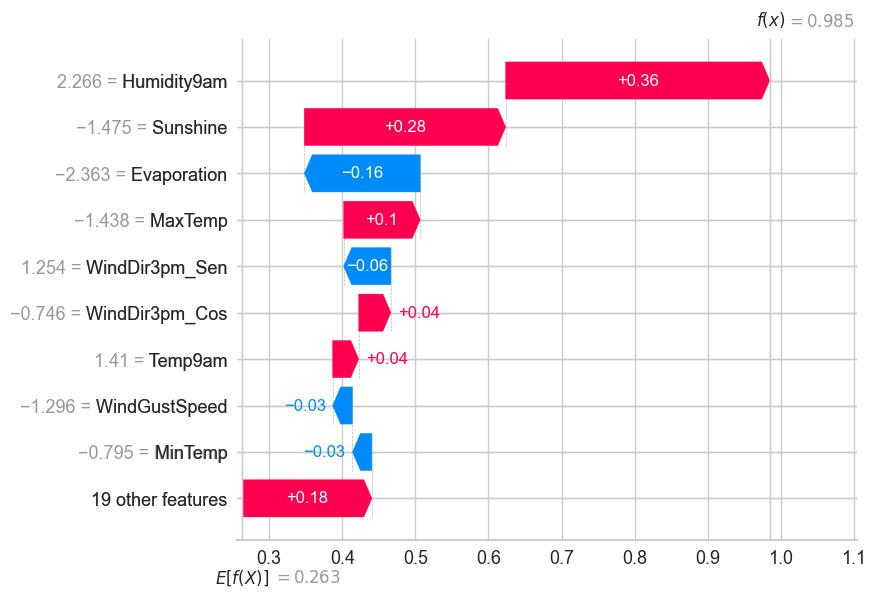

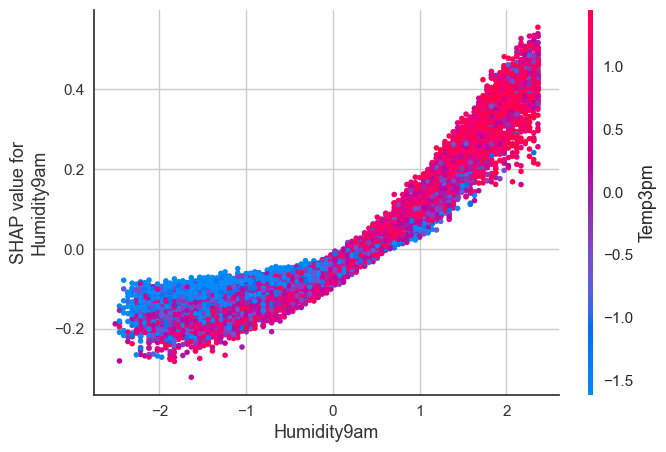

In [ ]:
nom_columns = X_train_scaled.columns

# Creamos el Explainer para el mejor modelo encontrado
explainer = shap.Explainer(MODELO_RN, X_train_scaled)

# Calculamos los valores SHAP para el conjunto de prueba
shap_values = explainer(X_test_scaled)

# Gráfico global: Summary Plot
shap.summary_plot(shap_values, X_test_scaled)

# Gráfico global: Bar Plot
shap.summary_plot(shap_values, X_test_scaled, plot_type="bar")

# Gráfico local: Force Plot
index = 0  # Cambia este índice según la observación que quieras analizar
shap.plots.force(shap_values[index], matplotlib=True, figsize=(18,4), text_rotation=45)

# Generar el waterfall plot
shap.plots.waterfall(shap_values[index])

# Gráfico local: Dependence Plot
variable = "Humidity9am"
shap.dependence_plot(variable, shap_values.values, X_test_scaled)

PermutationExplainer explainer: 28440it [12:16, 38.11it/s]                           


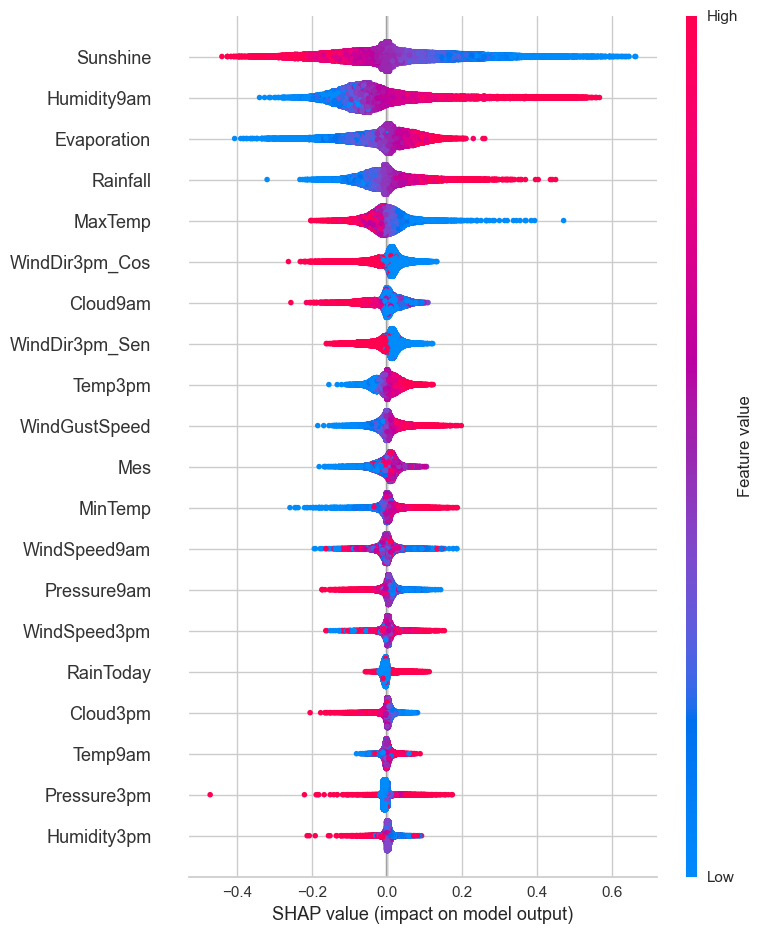

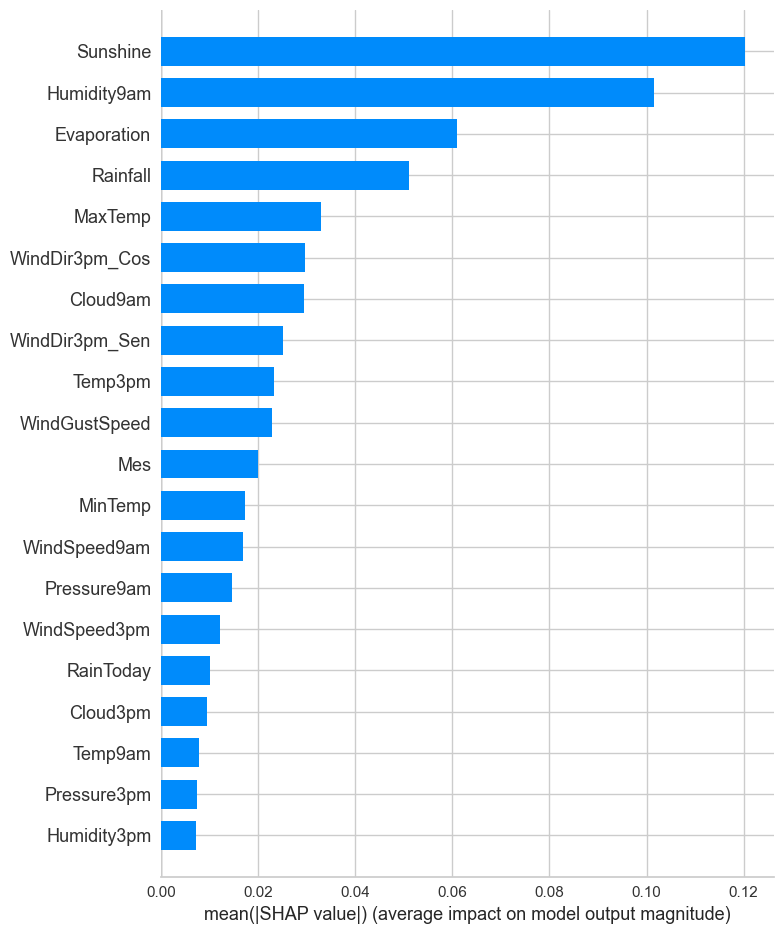

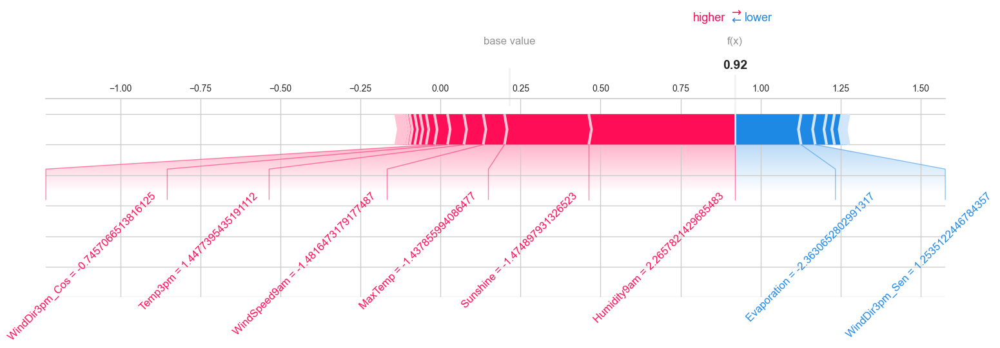

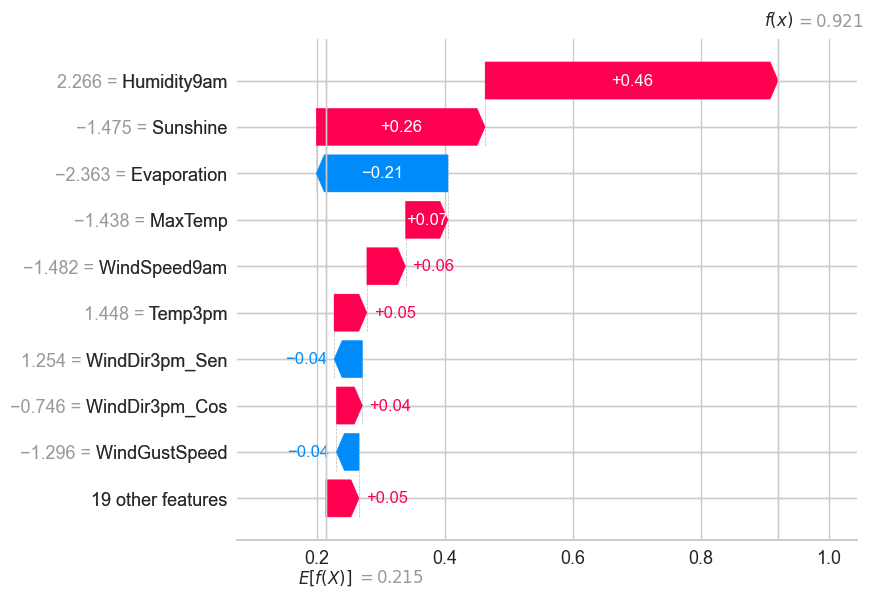

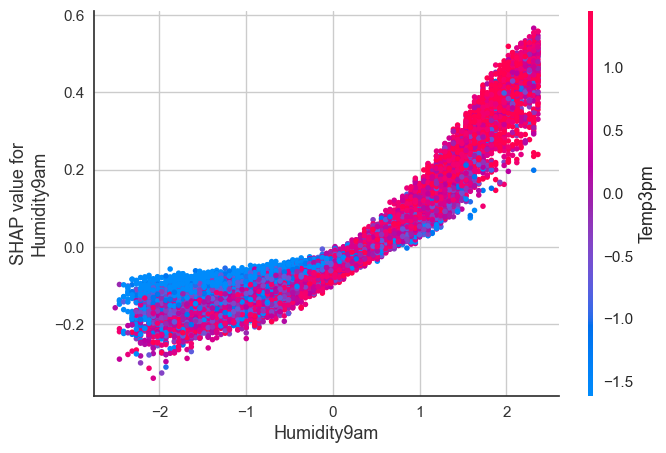

In [ ]:
nom_columns = X_train_scaled.columns

# Creamos el Explainer para el mejor modelo encontrado
explainer = shap.Explainer(MODELO_RN_OPTIMIZADO, X_train_scaled)

# Calculamos los valores SHAP para el conjunto de prueba
shap_values = explainer(X_test_scaled)

# Gráfico global: Summary Plot
shap.summary_plot(shap_values, X_test_scaled)

# Gráfico global: Bar Plot
shap.summary_plot(shap_values, X_test_scaled, plot_type="bar")

# Gráfico local: Force Plot
index = 0  # Cambia este índice según la observación que quieras analizar
shap.plots.force(shap_values[index], matplotlib=True, figsize=(18,4), text_rotation=45)

# Generar el waterfall plot
shap.plots.waterfall(shap_values[index])

# Gráfico local: Dependence Plot
variable = "Humidity9am"
shap.dependence_plot(variable, shap_values.values, X_test_scaled)

# Ejercicio 9

In [ ]:
def Metricas(modelo, X_test_scaled=X_test_scaled, y_test=y_test):
    y_pred = modelo.predict(X_test_scaled)

    # Métricas del modelo
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred)

    print(f"Modelo {modelo} - Accuracy: {accuracy:.4f}")
    print(f"Modelo {modelo} - Precision: {precision:.4f}")
    print(f"Modelo {modelo} - Recall: {recall:.4f}")
    print(f"Modelo {modelo} - F1-Score: {f1:.4f}")
    print(f"Modelo {modelo} - ROC-AUC: {roc_auc:.4f}")


    print("#######")
    print("f1-score ",round(f1,4))
    print("#######")

    # Matriz de confusión del modelo
    ConfusionMatrixDisplay.from_estimator(modelo, X_test_scaled, y_test, cmap='Blues')
    plt.title("Matriz de Confusión - Modelo Base")
    plt.show()

889/889 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step
Modelo <Sequential name=sequential, built=True> - Accuracy: 0.8489
Modelo <Sequential name=sequential, built=True> - Precision: 0.6807
Modelo <Sequential name=sequential, built=True> - Recall: 0.6073
Modelo <Sequential name=sequential, built=True> - F1-Score: 0.6419
Modelo <Sequential name=sequential, built=True> - ROC-AUC: 0.7628
#######
f1-score  0.6419
#######


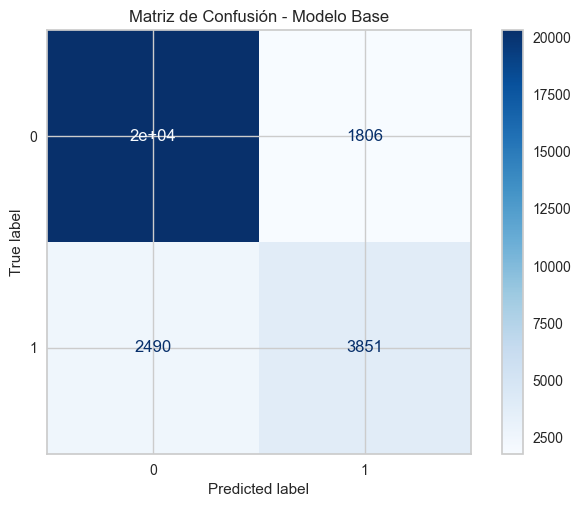

889/889 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step
Modelo <Sequential name=sequential_51, built=True> - Accuracy: 0.8534
Modelo <Sequential name=sequential_51, built=True> - Precision: 0.7206
Modelo <Sequential name=sequential_51, built=True> - Recall: 0.5594
Modelo <Sequential name=sequential_51, built=True> - F1-Score: 0.6298
Modelo <Sequential name=sequential_51, built=True> - ROC-AUC: 0.7486
#######
f1-score  0.6298
#######


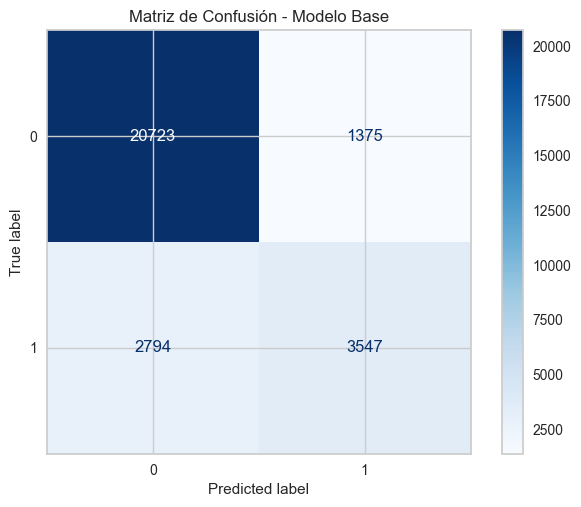

In [ ]:
def Metricas_RN(modelo, X_test_scaled=X_test_scaled, y_test=y_test):
    y_pred = modelo.predict(X_test_scaled)

    # Convertir las probabilidades en clases binarias (0 o 1)
    y_pred = np.where(y_pred < 0.5, 0, 1)

    # Métricas del modelo
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred)

    print(f"Modelo {modelo} - Accuracy: {accuracy:.4f}")
    print(f"Modelo {modelo} - Precision: {precision:.4f}")
    print(f"Modelo {modelo} - Recall: {recall:.4f}")
    print(f"Modelo {modelo} - F1-Score: {f1:.4f}")
    print(f"Modelo {modelo} - ROC-AUC: {roc_auc:.4f}")

    print("#######")
    print("f1-score ",round(f1,4))
    print("#######")

    # Matriz de confusión del modelo
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred, cmap='Blues')  # Usa from_predictions en lugar de from_estimator
    plt.title("Matriz de Confusión - Modelo Base")
    plt.show()

# Metricas(dummy_clf)
Metricas(MODELO_LOGISTICO)
Metricas(MODELO_LOGISTICO_OVERSAMPLER)
Metricas_RN(MODELO_RN)
Metricas_RN(MODELO_RN_OPTIMIZADO)